### Thermal wind balance transport estimation -- using new 600m isoabth boundary between ASC and ACoC
Based on salinity and temperature difference, see Sohail et al. 2024

In [1]:
import cosima_cookbook as cc
from dask.distributed import Client
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import numpy as np

import xarray as xr
import cmocean as cm
import cartopy.crs as ccrs
import cmocean as cm
import glob
import os

In [2]:
import matplotlib.dates as mdates
import datetime
import pandas as pd

In [3]:
%matplotlib inline

In [4]:
from matplotlib import rc
rc('font', **{'size':25})
rc('text', usetex=False)
rc('xtick', labelsize=25) #20 
rc('ytick', labelsize=25) #20
rc('axes', titlesize=25)    # fontsize of the axes title
rc('axes', labelsize=25) #24    # fontsize of the x and y labels

In [5]:
session=cc.database.create_session()
expt = '01deg_jra55v13_ryf9091'

In [154]:
import dask.config
from dask.distributed import Client,LocalCluster
from dask_jobqueue import PBSCluster

walltime = '03:00:00'
cores = 28
memory = '252GB'

cluster = PBSCluster(walltime=str(walltime), cores=cores, memory=str(memory),processes=cores,
                     job_extra=['-q normalbw','-P v45','-l ncpus='+str(cores),'-l mem='+str(memory),
                                '-l storage=gdata/ik11+gdata/e14+gdata/hh5+gdata/v45+gdata/cj50',
                                '-l jobfs=400GB'],
                     local_directory='$TMPDIR',
                     header_skip=["select"],
                     #python=os.environ["DASK_PYTHON"]
                    )
cluster

# and if you want even more power, you can use this to make it three nodes
cluster.scale(jobs=3)

# then, run this to make a dask client

c = Client(cluster)
c

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: /proxy/38981/status,
Dashboard: /proxy/38981/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.6.124.63:40509,Workers: 0
Dashboard: /proxy/38981/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [90]:
import dask.config
from dask.distributed import Client,LocalCluster


c = Client()


2024-10-30 18:00:57,647 - distributed.dashboard.components.scheduler - ERROR - 'str' object has no attribute 'text'
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/utils.py", line 838, in wrapper
    return func(*args, **kwargs)
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/dashboard/components/scheduler.py", line 3380, in update
    self.root.title.text = (
AttributeError: 'str' object has no attribute 'text'
2024-10-30 18:00:57,740 - bokeh.util.tornado - ERROR - Error thrown from periodic callback:
2024-10-30 18:00:57,743 - bokeh.util.tornado - ERROR - Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/tornado/gen.py", line 530, in callback
    result_list.append(f.result())
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-pa

In [91]:
c

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/38615/status,
Dashboard: /proxy/38615/status,Workers: 7
Total threads: 28,Total memory: 125.19 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38819,Workers: 7
Dashboard: /proxy/38615/status,Total threads: 28
Started: Just now,Total memory: 125.19 GiB
Comm: tcp://127.0.0.1:34775,Total threads: 4
Dashboard: /proxy/37415/status,Memory: 17.88 GiB
Nanny: tcp://127.0.0.1:46283,


In [7]:
ht = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='ht', 
                          session=session, frequency='static',
                          attrs={'cell_methods': 'time: point'}, n=1).sel(yt_ocean = slice(-79,-60)).chunk({ 'yt_ocean':250, 'xt_ocean':1200})
ht

<xarray.DataArray 'ht' (yt_ocean: 440, xt_ocean: 3600)> Size: 6MB
dask.array<rechunk-merge, shape=(440, 3600), dtype=float32, chunksize=(250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
Attributes:
    long_name:      ocean depth on t-cells
    units:          m
    valid_range:    [-1.e+09  1.e+09]
    cell_methods:   time: point
    standard_name:  sea_floor_depth_below_geoid
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf90...
    contact:        Andy Hogg
    email:          andy.hogg@anu.edu.au
    created:        2020-06-11
    description:    0.1 degree ACCESS-OM2 global model configuration with JRA...
    notes:          Additional daily outputs saved from 1 Jan 1950 to 31 Dec ...
    url:            https://github.com/COSIMA/01deg_jra55_ryf/tree/01deg_jra5...

In [8]:
# location limits of dataset - choosing slice near totten
#lon_lim = slice(-270, -230) #slice(30, 45)#
lat_lim = slice(-79, -60) #slice(-70, -65)

ht_region = ht.sel( yt_ocean = lat_lim)

In [9]:
exp_ctrl= '01deg_jra55v13_ryf9091'
exp_wthmp= '01deg_jra55v13_ryf9091_qian_wthmp'
exp_wthp= '01deg_jra55v13_ryf9091_qian_wthp'
lat_lim = slice(-79, -60)
lon_lim = slice(-279.99,80)

#### SET EXPT HERE
expt = exp_wthmp


In [10]:
# We will use an annual average from 10 year in the RYF run
start_time_mw='2110-01-31 00:00:00' 
end_time_mw='2159-12-31 00:00:00'
flex_period = slice(start_time_mw , end_time_mw)

In [11]:
hu = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='hu', 
                          session=session, frequency='static',
                          attrs={'cell_methods': 'time: point'}, n=1).sel(yu_ocean = slice(-79,-60)).chunk({ 'yu_ocean':250, 'xu_ocean':1200})

In [12]:
ht = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='ht', 
                          session=session, frequency='static',
                          attrs={'cell_methods': 'time: point'}, n=1).sel(yt_ocean = slice(-79,-60)).chunk({ 'yt_ocean':250, 'xt_ocean':1200})

In [13]:
area_t = cc.querying.getvar(expt='01deg_jra55v13_ryf9091', variable='area_t', 
                          session=session, frequency='static',
                          attrs={'cell_methods': 'time: point'}, n=1).sel(xt_ocean= lon_lim, yt_ocean = lat_lim)


In [14]:
# Import edges of st_ocean and add lat/lon dimensions:  , start_time=start_time_mw, end_time=end_time_mw,
st_edges_ocean = cc.querying.getvar(expt, 'st_edges_ocean', session, n=1)
st_edges_array = st_edges_ocean.expand_dims({'yt_ocean': ht.yt_ocean, 'xt_ocean': ht.xt_ocean}, axis=[1, 2])


# Adjust edges at bottom for partial thickness:
st_edges_with_partial = st_edges_array.where(st_edges_array<ht, other=ht)
thickness = st_edges_with_partial.diff(dim='st_edges_ocean')

# Change coordinate of thickness to st_ocean (needed for multipling with other variables):
st_ocean = cc.querying.getvar(expt, 'st_ocean', session, n=1)
thickness['st_edges_ocean'] = st_ocean.values
thickness = thickness.rename(({'st_edges_ocean': 'st_ocean'}))


In [15]:
hu.load()

<xarray.DataArray 'hu' (yu_ocean: 440, xu_ocean: 3600)> Size: 6MB
array([[      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       ...,
       [1931.0061, 1857.9861, 1785.2361, ..., 2235.639 , 2171.7917,
        2056.375 ],
       [1931.0061, 1857.9861, 1785.2361, ..., 2235.639 , 2171.7917,
        2062.0557],
       [1979.5555, 1882.7916, 1777.5416, ..., 2225.014 , 2179.8057,
        2082.9443]], dtype=float32)
Coordinates:
  * xu_ocean  (xu_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.8 79.9 80.0
  * yu_ocean  (yu_ocean) float64 4kB -78.98 -78.93 -78.89 ... -60.07 -60.02
    geolon_c  (yu_ocean, xu_ocean) float32 6MB nan nan nan ... 79.8 79.9 80.0
    geolat_c  (yu_ocean, xu_ocean) float32 6MB nan nan nan ... -60.02 -60.02
Attributes:
    long_name:     ocean depth on u-cells
    units:         m
    valid_range:   [-1.e+09  1.e+09]
    cell_methods:  time: point
    ncfiles:       ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf909...
    contact:       Andy Hogg
    email:         andy.hogg@anu.edu.au
    created:       2020-06-11
    description:   0.1 degree ACCESS-OM2 global model configuration with JRA5...
    notes:         Additional daily outputs saved from 1 Jan 1950 to 31 Dec 1...
    url:           https://github.com/COSIMA/01deg_jra55_ryf/tree/01deg_jra55...

In [16]:
# defining B-grid using xgcm
path_to_folder = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091/output000/ocean/'
ocean_grid = xr.open_mfdataset(path_to_folder+'ocean_grid.nc', combine='by_coords')

In [17]:
# NEEDload coordinates and grid specifications
geolat_t = cc.querying.getvar(expt, 'geolat_t', session=session, n=1)
geolon_t = cc.querying.getvar(expt, 'geolon_t', session=session, n=1)

dxt = cc.querying.getvar(expt=expt, variable='dxt', session=session, frequency='static', n=1)
dyt = cc.querying.getvar(expt=expt, variable='dyt', session=session, frequency='static', n=1)

dxu = cc.querying.getvar(expt=expt, variable='dxu', session=session, frequency='static', n=1)
dyu = cc.querying.getvar(expt=expt, variable='dyu', session=session, frequency='static', n=1)

In [18]:
#sea_level_lim = sea_level.sel( xt_ocean= lon_lim, yt_ocean=lat_lim, time = flex_period)

# coordinates
lat_t = geolat_t.sel( xt_ocean= lon_lim,yt_ocean=lat_lim)
lon_t = geolon_t.sel(xt_ocean= lon_lim, yt_ocean=lat_lim)

dxt_lim = dxt.sel(xt_ocean= lon_lim,yt_ocean=lat_lim)
dyt_lim = dyt.sel(xt_ocean= lon_lim,yt_ocean=lat_lim)

dxu_lim = dxu.sel(xu_ocean= lon_lim,yu_ocean=lat_lim)
dyu_lim = dyu.sel(xu_ocean= lon_lim,yu_ocean=lat_lim)

In [19]:
## need to run seperately or it will crash
import xgcm
coordinates = xr.merge([dxt_lim, dyt_lim, dxu_lim, dyu_lim])

In [20]:
vel = xr.merge([hu,coordinates, ht, ocean_grid.sel(xt_ocean= lon_lim,xu_ocean= lon_lim, yt_ocean=lat_lim, yu_ocean = lat_lim).isel(time = 0)],compat='override')# time is flex_period before

In [21]:
vel.coords['xt_ocean'].attrs.update(axis='X')
vel.coords['xu_ocean'].attrs.update(axis='X', c_grid_axis_shift=0.5, periodic=True)
vel.coords['yt_ocean'].attrs.update(axis='Y')
vel.coords['yu_ocean'].attrs.update(axis='Y', c_grid_axis_shift=0.5)
metrics = {
    ('X',): ['dxt', 'dxu'], # X distances
    ('Y',): ['dyt', 'dyu'], # Y distances
    ('X', 'Y'): ['area_t', 'area_u'] # Areas
}

In [22]:
grid = xgcm.Grid(vel, periodic=['X'], metrics = metrics,boundary='extend')
grid

<xgcm.Grid>
X Axis (periodic, boundary='extend'):
  * center   xt_ocean --> right
  * right    xu_ocean --> center
Y Axis (not periodic, boundary='extend'):
  * center   yt_ocean --> right
  * right    yu_ocean --> center

In [23]:
## mask with clusters
cluster_mask_access = xr.open_mfdataset('/home/561/qo9901/Antarctic-Eddy-Res-Compare/largest_3cluster_mask_xr_accessom201.nc')
cluster_mask_access = cluster_mask_access.assign_coords(xu_ocean = ('xu_ocean', hu.xu_ocean.data), yu_ocean = ('yu_ocean', hu.yu_ocean.data))

### interpolate to t grid
cluster_mask_access = grid.interp(cluster_mask_access.__xarray_dataarray_variable__, axis = ['X','Y'])
cluster_mask_access = cluster_mask_access> 0.25

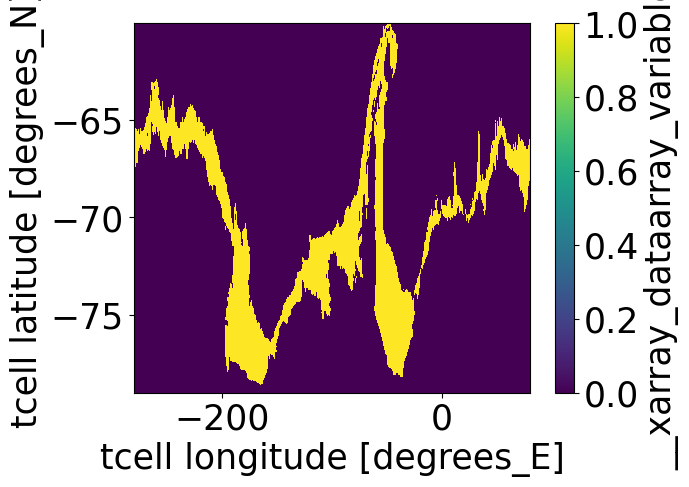

In [24]:
cluster_mask_access.plot()

In [25]:
cluster_mask_shelfwcanyons = ~xr.open_mfdataset('/home/561/qo9901/MW-perturb-ASC/600misobath_sans_canyons_cluster_mask_xr_accessom201.nc')
## note inverse in cluster_mask_shelfwcanyons
cluster_mask_shelfwcanyons= cluster_mask_shelfwcanyons.assign_coords(xu_ocean = ('xu_ocean', hu.xu_ocean.data), yu_ocean = ('yu_ocean', hu.yu_ocean.data))
# cluster_mask_shelfwcanyons == True: Shelf 
cluster_mask_shelfwcanyons_t = grid.interp(cluster_mask_shelfwcanyons.__xarray_dataarray_variable__, axis = ['X','Y'])
cluster_mask_shelfwcanyons_t = cluster_mask_shelfwcanyons_t> 0.25

In [27]:
# ice shelf edge boundary mask
from scipy.ndimage import binary_erosion

# Step 1: Dilate the boolean array
eroded = binary_erosion(cluster_mask_access)

# Step 2: Find the boundary by taking the difference
ACoC_S_boundary_mask = eroded ^ cluster_mask_access # XOR operation to find the boundary

# Convert the boundary mask back to xarray DataArray
ACoC_S_boundary_mask_da = xr.DataArray(ACoC_S_boundary_mask, \
                                dims=cluster_mask_access.dims,\
                                coords=cluster_mask_access.coords)\
                            .where(cluster_mask_shelfwcanyons_t == True).where(ht<800)
#removes very shallow area overlapping with N

# Step 2: Find the boundary by taking the difference
ASC_N_boundary_mask = eroded ^ cluster_mask_access# XOR operation to find the boundary

# Convert the boundary mask back to xarray DataArray
ASC_N_boundary_mask_da = xr.DataArray(ASC_N_boundary_mask, \
                                dims=cluster_mask_access.dims,\
                                coords=cluster_mask_access.coords)\
                        .where(cluster_mask_shelfwcanyons_t == False) 
#NB no need for cluster_mask_access at ASC_N, or else a bunch of points get removed

eroded_da =  xr.DataArray(eroded, \
                                dims=cluster_mask_shelfwcanyons_t.dims,\
                                coords=cluster_mask_shelfwcanyons_t.coords)

In [27]:
cluster_mask_shelfwcanyons_t.values

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ..., False,  True,  True],
       [ True,  True,  True, ..., False,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

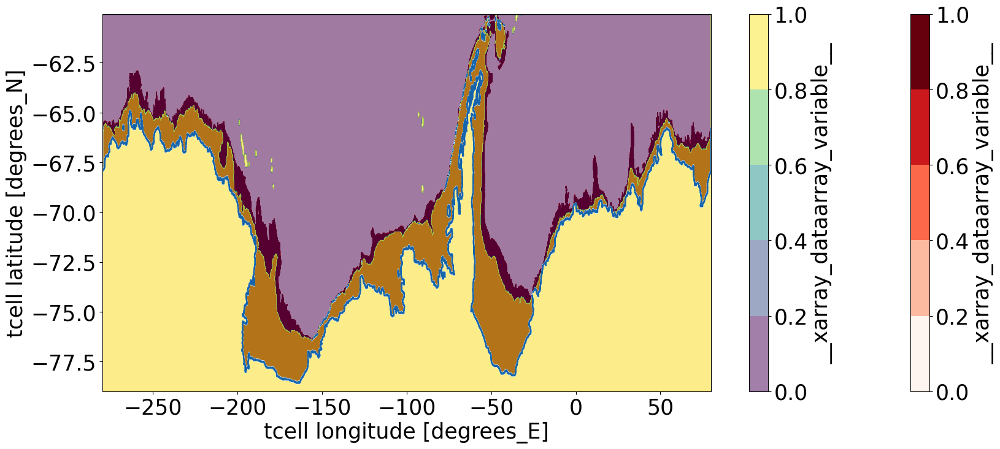

In [51]:
plt.figure(figsize = (20,8))
#eroded_da.where(cluster_mask_access == True).plot.contour()
cluster_mask_access.plot.contourf(cmap ='Reds')
cluster_mask_shelfwcanyons_t.plot.contourf(alpha = 0.5)
ACoC_S_boundary_mask_da.where(cluster_mask_shelfwcanyons_t == True).plot.contour(cmap = 'Blues')
#ASC_N_boundary_mask_da.plot.contour(cmap = 'Greys')

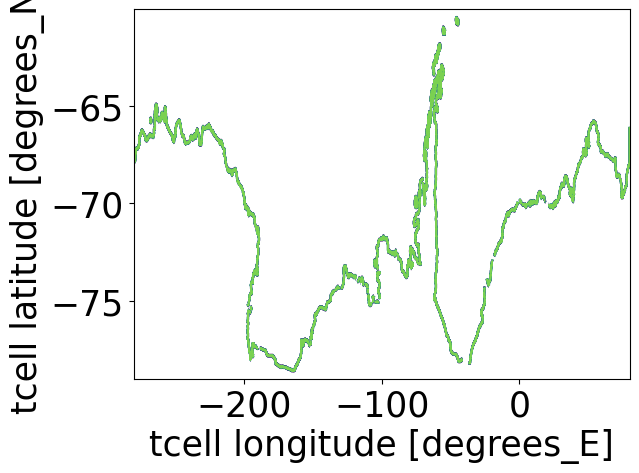

In [82]:
ACoC_S_boundary_mask_da.plot.contour(cmap = 'Blues')
ACoC_S_boundary_mask_da.where(ht<800).plot.contour()

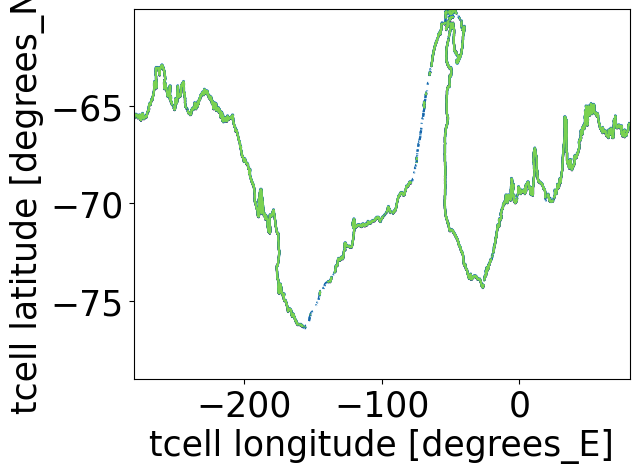

In [43]:
ASC_N_boundary_mask_da.plot.contour(cmap = 'Blues')
ASC_N_boundary_mask_da.where(cluster_mask_access == True).plot.contour()


In [29]:
from scipy.ndimage import binary_dilation

# Step 1: Dilate the boolean array
dilated = binary_dilation(cluster_mask_shelfwcanyons_t)

# Step 2: Find the boundary by taking the difference
boundary_mask = dilated ^ cluster_mask_shelfwcanyons_t  # XOR operation to find the boundary

# Convert the boundary mask back to xarray DataArray
boundary_mask_da = xr.DataArray(boundary_mask, \
                                dims=cluster_mask_shelfwcanyons_t.dims,\
                                coords=cluster_mask_shelfwcanyons_t.coords)
dilated_da =  xr.DataArray(dilated, \
                                dims=cluster_mask_shelfwcanyons_t.dims,\
                                coords=cluster_mask_shelfwcanyons_t.coords)

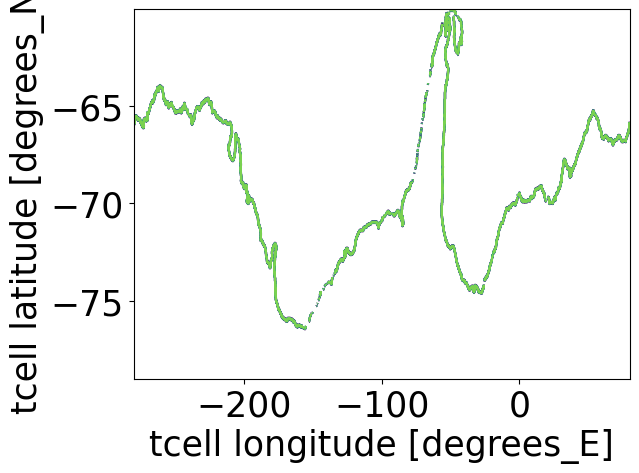

In [30]:
boundary_mask_da.where(cluster_mask_access == True).plot.contour()

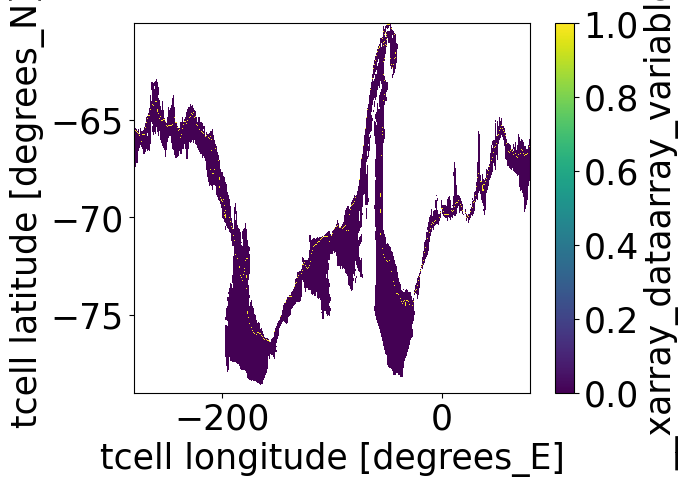

In [31]:
boundary_mask_da.where(cluster_mask_access == True).plot()

In [32]:
## get indices following true boundary
bound = boundary_mask_da.where(cluster_mask_access == True).compute().values
bound_idx = np.where(bound ==1)#.squeeze()

In [53]:
## get indices following true boundary
bound_N = ASC_N_boundary_mask_da.where(cluster_mask_access == True).compute().values
bound_N_idx = np.where(bound_N ==1)

In [84]:
## get indices following true boundary
bound_S = ACoC_S_boundary_mask_da.where(cluster_mask_access == True).compute().values
bound_S_idx = np.where(bound_S ==1)

In [33]:
bound_idx #[0] is latitude, [1] is longitude

(array([ 61,  61,  61, ..., 438, 438, 438]),
 array([1242, 1243, 1244, ..., 2333, 2334, 2335]))

In [ ]:
lat_line = [area_t.yt_ocean.isel(yt_ocean =  bound_idx[0][j])for j in range(len(bound_idx[0]))]
lon_line = [area_t.xt_ocean.isel(xt_ocean = bound_idx[1][j]) for j in range(len(bound_idx[0]))]

In [26]:
from dask import compute, delayed

In [27]:
from scipy.spatial import cKDTree
from geopy.distance import geodesic

# Function to compute the geodesic distance between two lat-lon points in km
@delayed
def compute_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).km
    

# Function to calculate distances of all grid points to the contour
def calculate_distance_to_contour(mask, lats, lons):
    # Find contour (boundary) points from the mask
    contour_points = np.array(np.where(mask == 1)).T
    
    # Create a k-d tree for fast nearest-neighbor lookup
    tree = cKDTree(contour_points)
    
    # Prepare array to store distances
    distance_map = np.full(lats.shape, np.inf)
    
    # Iterate over all points in the grid
    for i in range(lats.shape[0]):
        for j in range(lats.shape[1]):
            # Find the nearest contour point
            _, nearest_idx = tree.query([i, j])
            contour_lat = lats[contour_points[nearest_idx, 0], contour_points[nearest_idx, 1]]
            contour_lon = lons[contour_points[nearest_idx, 0], contour_points[nearest_idx, 1]]
            
            # Compute the geodesic distance
            distance_map[i, j] = compute_distance(lats[i, j], lons[i, j], contour_lat, contour_lon)
            if j % 100: print(i,j)
    
    return distance_map

# Function to calculate the average temperature within N km of the contour
@delayed
def area_avg_temperature_near_contour(temp, mask, lats, lons, N):
    # Calculate the distance of all points to the contour
    distance_to_contour = calculate_distance_to_contour(mask, lats, lons)
    
    # Select grid points within N km of the contour
    within_N_km = distance_to_contour <= N
    '''
    # Calculate the average temperature within N km
    avg_temp = np.mean(temp[within_N_km])
     return avg_temp

    '''
    # Extract temperatures and areas within N km
    temp_within_N_km = temp[within_N_km]

    areas_within_N_km = area_t[within_N_km]
    
    # Calculate the area-weighted average temperature
    weighted_avg_temp = np.sum(temp_within_N_km * areas_within_N_km) / np.sum(areas_within_N_km)
    
    return weighted_avg_temp

# Example usage:
# temp: 2D numpy array with temperature data
# mask: 2D numpy array with contour mask (1s and 0s)
# lats, lons: 2D arrays of latitudes and longitudes
# N: distance threshold in km (e.g., 50 km)



In [28]:
lon_grid, lat_grid = np.meshgrid(area_t.xt_ocean.data, area_t.yt_ocean.data)

In [29]:
# Function to calculate distances of all grid points to the contour
def calculate_distance_to_contour(mask, lats, lons):
    # Find contour (boundary) points from the mask
    contour_points = np.array(np.where(mask == 1)).T
    
    # Create a k-d tree for fast nearest-neighbor lookup
    tree = cKDTree(contour_points)
    
    # Prepare array to store distances
    distance_map = [] #np.full(lats.shape, np.inf)
    
    # Iterate over all points in the grid
    for i in range(lats.shape[0]):
        delayed_results = []
        for j in range(lats.shape[1]):
            # Find the nearest contour point
            _, nearest_idx = tree.query([i, j])
            contour_lat = lats[contour_points[nearest_idx, 0], contour_points[nearest_idx, 1]]
            contour_lon = lons[contour_points[nearest_idx, 0], contour_points[nearest_idx, 1]]
            
            # Compute the geodesic distance
            delayed_results.append(compute_distance(lats[i, j], lons[i, j], contour_lat, contour_lon))
            if j % 100 == 0 : print(i,j)
        distance_map_j = compute(*delayed_results)
        distance_map.append(distance_map_j)
    
    return distance_map, distance_map_j


In [ ]:
%%time
distance_map, distance_map_j = calculate_distance_to_contour(bound, lat_grid, lon_grid)

In [41]:
distance_to_contour = np.array(distance_map)
distance_to_contour.shape

(440, 3600)

In [46]:
xr.DataArray(distance_to_contour, coords = area_t.coords).to_netcdf('distance_to_contour.nc')

In [63]:
%%time
distance_map_N, distance_map_N_j = calculate_distance_to_contour(bound_N, lat_grid, lon_grid)

0 0
0 100
0 200
0 300
0 400
0 500
0 600
0 700
0 800
0 900
0 1000
0 1100
0 1200
0 1300
0 1400
0 1500
0 1600
0 1700
0 1800
0 1900
0 2000
0 2100
0 2200
0 2300
0 2400
0 2500
0 2600
0 2700
0 2800
0 2900
0 3000
0 3100
0 3200
0 3300
0 3400
0 3500
1 0
1 100
1 200
1 300
1 400
1 500
1 600
1 700
1 800
1 900
1 1000
1 1100
1 1200
1 1300
1 1400
1 1500
1 1600
1 1700
1 1800
1 1900
1 2000
1 2100
1 2200
1 2300
1 2400
1 2500
1 2600
1 2700
1 2800
1 2900
1 3000
1 3100
1 3200
1 3300
1 3400
1 3500
2 0
2 100
2 200
2 300
2 400
2 500
2 600
2 700
2 800
2 900
2 1000
2 1100
2 1200
2 1300
2 1400
2 1500
2 1600
2 1700
2 1800
2 1900
2 2000
2 2100
2 2200
2 2300
2 2400
2 2500
2 2600
2 2700
2 2800
2 2900
2 3000
2 3100
2 3200
2 3300
2 3400
2 3500
3 0
3 100
3 200
3 300
3 400
3 500
3 600
3 700
3 800
3 900
3 1000
3 1100
3 1200
3 1300
3 1400
3 1500
3 1600
3 1700
3 1800
3 1900
3 2000
3 2100
3 2200
3 2300
3 2400
3 2500
3 2600
3 2700
3 2800
3 2900
3 3000
3 3100
3 3200
3 3300
3 3400
3 3500
4 0
4 100
4 200
4 300
4 400
4 500
4 600


In [65]:
distance_to_contour_N = np.array(distance_map_N)
xr.DataArray(distance_to_contour_N, coords = area_t.coords).to_netcdf('distance_to_contour_N.nc')

In [85]:
%%time
distance_map_S, distance_map_S_j = calculate_distance_to_contour(bound_S, lat_grid, lon_grid)

0 0
0 100
0 200
0 300
0 400
0 500
0 600
0 700
0 800
0 900
0 1000
0 1100
0 1200
0 1300
0 1400
0 1500
0 1600
0 1700
0 1800
0 1900
0 2000
0 2100
0 2200
0 2300
0 2400
0 2500
0 2600
0 2700
0 2800
0 2900
0 3000
0 3100
0 3200
0 3300
0 3400
0 3500
1 0
1 100
1 200
1 300
1 400
1 500
1 600
1 700
1 800
1 900
1 1000
1 1100
1 1200
1 1300
1 1400
1 1500
1 1600
1 1700
1 1800
1 1900
1 2000
1 2100
1 2200
1 2300
1 2400
1 2500
1 2600
1 2700
1 2800
1 2900
1 3000
1 3100
1 3200
1 3300
1 3400
1 3500
2 0
2 100
2 200
2 300
2 400
2 500
2 600
2 700
2 800
2 900
2 1000
2 1100
2 1200
2 1300
2 1400
2 1500
2 1600
2 1700
2 1800
2 1900
2 2000
2 2100
2 2200
2 2300
2 2400
2 2500
2 2600
2 2700
2 2800
2 2900
2 3000
2 3100
2 3200
2 3300
2 3400
2 3500
3 0
3 100
3 200
3 300
3 400
3 500
3 600
3 700
3 800
3 900
3 1000
3 1100
3 1200
3 1300
3 1400
3 1500
3 1600
3 1700
3 1800
3 1900
3 2000
3 2100
3 2200
3 2300
3 2400
3 2500
3 2600
3 2700
3 2800
3 2900
3 3000
3 3100
3 3200
3 3300
3 3400
3 3500
4 0
4 100
4 200
4 300
4 400
4 500
4 600


In [87]:
distance_to_contour_S = np.array(distance_map_S)
xr.DataArray(distance_to_contour_S, coords = area_t.coords).to_netcdf('distance_to_contour_S.nc')

In [88]:
distance_to_contour_S

array([[1235.04097456, 1235.04097456, 1235.04097456, ..., 1046.31542748,
        1046.69926358, 1047.09085055],
       [1230.32483653, 1230.32483653, 1230.32483653, ..., 1041.6751535 ,
        1042.06214457, 1042.45694837],
       [1225.60871171, 1225.60871171, 1225.60871171, ..., 1037.0355709 ,
        1037.42574464, 1037.82379345],
       ...,
       [ 660.39549392,  660.41457154,  660.47180103, ...,  660.47180103,
         660.41457154,  660.39549392],
       [ 665.94570905,  665.96465684,  666.02149694, ...,  666.02149694,
         665.96465684,  665.94570905],
       [ 671.50426863,  671.52308855,  671.5795451 , ...,  671.5795451 ,
         671.52308855,  671.50426863]])

## importing each boundary and getting vol ave quantities within certain dist of contour

In [30]:
distance_to_contour = xr.open_mfdataset('distance_to_contour.nc').__xarray_dataarray_variable__.values

In [31]:
distance_to_contour_N = xr.open_mfdataset('distance_to_contour_N.nc').__xarray_dataarray_variable__.values

In [32]:
distance_to_contour_S = xr.open_mfdataset('distance_to_contour_S.nc').__xarray_dataarray_variable__.values

In [33]:
# Select grid points within N km of the contour
N = 30 #[km] prev 50
within_N_km = distance_to_contour <= N
within_N_km_N = distance_to_contour_N <= N
within_N_km_S = distance_to_contour_S <= N

within_N_km

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

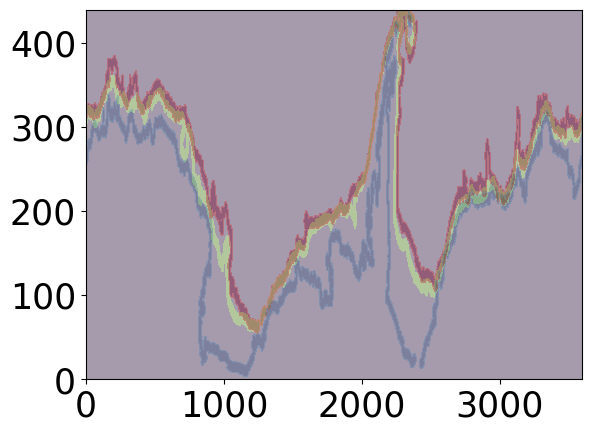

In [34]:
plt.contourf(within_N_km)
plt.contourf(within_N_km_N, alpha = 0.5, cmap = 'Reds')
plt.contourf(within_N_km_S, alpha = 0.25, cmap = 'Blues')

In [34]:
import gc

In [35]:
@delayed
def area_depth_ave(var_within_N_km,areas_within_N_km):
    #var_t: one time step of 
    return  np.nansum(var_within_N_km * areas_within_N_km) / np.nansum(areas_within_N_km)


def area_ave_quantity_Nkm_range(var_name, within_N_km, time_range):
    #var_grid: 2d quantity
    # Select grid points within N km of the contour
     # within_N_km
    #var_name: str for variable name
      
    ## save temp differences depth-av
    var = cc.querying.getvar(expt=expt, variable= var_name, 
                              session=session, frequency='1 monthly', \
                             chunks = {'time': 100,  'yt_ocean':500, 'xt_ocean':1200})\
            .sel(yt_ocean = slice(-79,-60))#.load()
    var_grid = var * cluster_mask_access
    print(var_grid)
    areas_within_N_km = (area_t*cluster_mask_access).values[within_N_km]
    
    delayed_results = []
    for tt in time_range:
        print(' tt= ', tt)
            
        var_depthav = (var_grid.isel(time = tt)*thickness).sum('st_ocean') / thickness.sum('st_ocean')
        var_within_N_km = var_depthav.values[within_N_km]
        # Calculate the area-weighted average temperature
        results = area_depth_ave(var_within_N_km,areas_within_N_km)
        delayed_results.append(results)
        
    weighted_avg_var = compute(*delayed_results)
    return weighted_avg_var

In [36]:
from dask import persist

In [46]:
%%time
weighted_avg_temp = area_ave_quantity_Nkm_range('temp', within_N_km,range(50))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  0
 tt=  1
 tt=  2
 tt=  3
 tt=  4
 tt=  5
 tt=  6
 tt=  7
 tt=  8
 tt=  9
 tt=  10
 tt=  11
 tt=  12
 tt=  13
 tt=  14
 tt=  15
 tt=  16
 tt=  17
 tt=  18
 tt=  19
 tt=  20
 tt=  21
 tt=  22
 tt=  23
 tt=  24
 tt=  25
 tt=  26
 tt=  27
 tt=  28
 tt=  29
 tt=  30
 tt=  31
 tt=  32
 tt=  33
 tt=  34
 tt=  35
 tt=  36
 tt=  37
 tt=  38
 tt=  39
 tt=  40
 tt=  41
 tt=  42
 tt=  43
 tt=  44
 tt=  45
 tt=  46
 tt=  47
 tt=  48
 tt=  49
CPU times: user 6min 41s, sy

In [48]:
%%time
weighted_avg_temp_2 = area_ave_quantity_Nkm_range('temp', within_N_km,range(50,200))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  50
 tt=  51
 tt=  52
 tt=  53
 tt=  54
 tt=  55
 tt=  56
 tt=  57
 tt=  58
 tt=  59
 tt=  60
 tt=  61
 tt=  62
 tt=  63
 tt=  64
 tt=  65
 tt=  66
 tt=  67
 tt=  68
 tt=  69
 tt=  70
 tt=  71
 tt=  72
 tt=  73
 tt=  74
 tt=  75
 tt=  76
 tt=  77
 tt=  78
 tt=  79
 tt=  80
 tt=  81
 tt=  82
 tt=  83
 tt=  84
 tt=  85
 tt=  86
 tt=  87
 tt=  88
 tt=  89
 tt=  90
 tt=  91
 tt=  92
 tt=  93
 tt=  94
 tt=  95
 tt=  96
 tt=  97
 tt=  98
 tt=  99
 tt=  100
 tt=  10

In [46]:
%%time 
# with thickness weighting in parallel
weighted_avg_temp_3 = area_ave_quantity_Nkm_range('temp', within_N_km,range(200,250))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  200
 tt=  201
 tt=  202
 tt=  203
 tt=  204
 tt=  205
 tt=  206
 tt=  207
 tt=  208
 tt=  209
 tt=  210
 tt=  211
 tt=  212
 tt=  213
 tt=  214
 tt=  215
 tt=  216
 tt=  217
 tt=  218
 tt=  219
 tt=  220
 tt=  221
 tt=  222
 tt=  223
 tt=  224
 tt=  225
 tt=  226
 tt=  227
 tt=  228
 tt=  229
 tt=  230
 tt=  231
 tt=  232
 tt=  233
 tt=  234
 tt=  235
 tt=  236
 tt=  237
 tt=  238
 tt=  239
 tt=  240
 tt=  241
 tt=  242
 tt=  243
 tt=  244
 tt=  245
 tt=  24

In [55]:
%%time
# - using N = 30km
weighted_avg_temp_30 = area_ave_quantity_Nkm_range('temp', within_N_km,range(200))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  0
 tt=  1
 tt=  2
 tt=  3
 tt=  4
 tt=  5
 tt=  6
 tt=  7
 tt=  8
 tt=  9
 tt=  10
 tt=  11
 tt=  12
 tt=  13
 tt=  14
 tt=  15
 tt=  16
 tt=  17
 tt=  18
 tt=  19
 tt=  20
 tt=  21
 tt=  22
 tt=  23
 tt=  24
 tt=  25
 tt=  26
 tt=  27
 tt=  28
 tt=  29
 tt=  30
 tt=  31
 tt=  32
 tt=  33
 tt=  34
 tt=  35
 tt=  36
 tt=  37
 tt=  38
 tt=  39
 tt=  40
 tt=  41
 tt=  42
 tt=  43
 tt=  44
 tt=  45
 tt=  46
 tt=  47
 tt=  48
 tt=  49
 tt=  50
 tt=  51
 tt=  52
 

In [40]:
%%time
weighted_avg_temp_30_2 = area_ave_quantity_Nkm_range('temp', within_N_km,range(200,600))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  200
 tt=  201
 tt=  202
 tt=  203
 tt=  204
 tt=  205
 tt=  206
 tt=  207
 tt=  208
 tt=  209
 tt=  210
 tt=  211
 tt=  212
 tt=  213
 tt=  214
 tt=  215
 tt=  216
 tt=  217
 tt=  218
 tt=  219
 tt=  220
 tt=  221
 tt=  222
 tt=  223
 tt=  224
 tt=  225
 tt=  226
 tt=  227
 tt=  228
 tt=  229
 tt=  230
 tt=  231
 tt=  232
 tt=  233
 tt=  234
 tt=  235
 tt=  236
 tt=  237
 tt=  238
 tt=  239
 tt=  240
 tt=  241
 tt=  242
 tt=  243
 tt=  244
 tt=  245
 tt=  24

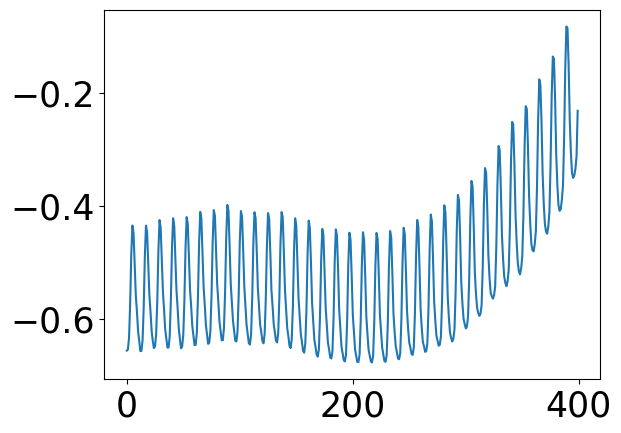

In [42]:
plt.plot(np.array(weighted_avg_temp_30_2) - 273)

In [46]:
xr.DataArray(np.array(weighted_avg_temp_30_2)).to_netcdf('temp_N30_ASC_AcoC_t200_600.nc')

In [ ]:
xr.DataArray(weighted_avg_temp_30).to_netcdf('temp_N30_ASC_AcoC_t0_200.nc')

In [ ]:
%%time
weighted_avg_salt_30 = area_ave_quantity_Nkm_range('salt', within_N_km,range(0,200))

In [48]:
xr.DataArray(np.array(weighted_avg_salt_30)).to_netcdf('salt_N30_ASC_AcoC_t0_200.nc')

In [45]:
%%time
weighted_avg_salt_30_2 = area_ave_quantity_Nkm_range('salt', within_N_km,range(200,400))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  200
 tt=  201
 tt=  202
 tt=  203
 tt=  204
 tt=  205
 tt=  206
 tt=  207
 tt=  208
 tt=  209
 tt=  210
 tt=  211
 tt=  212
 tt=  213
 tt=  214
 tt=  215
 tt=  216
 tt=  217
 tt=  218
 tt=  219
 tt=  220
 tt=  221
 tt=  222
 tt=  223
 tt=  224
 tt=  225
 tt=  226
 tt=  227
 tt=  228
 tt=  229
 tt=  230
 tt=  231
 tt=  232
 tt=  233
 tt=  234
 tt=  235
 tt=  236
 tt=  237
 tt=  238
 tt=  239
 tt=  240
 tt=  241
 tt=  242
 tt=  243
 tt=  244
 tt=  245
 tt=  24

In [46]:
xr.DataArray(np.array(weighted_avg_salt_30_2)).to_netcdf('salt_N30_ASC_AcoC_t200_400.nc')

In [ ]:
%%time
weighted_avg_salt_30_3 = area_ave_quantity_Nkm_range('salt', within_N_km,range(400,600))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  400
 tt=  401
 tt=  402
 tt=  403
 tt=  404
 tt=  405
 tt=  406
 tt=  407
 tt=  408
 tt=  409
 tt=  410
 tt=  411
 tt=  412
 tt=  413
 tt=  414
 tt=  415
 tt=  416
 tt=  417
 tt=  418
 tt=  419
 tt=  420
 tt=  421
 tt=  422
 tt=  423
 tt=  424
 tt=  425
 tt=  426
 tt=  427
 tt=  428
 tt=  429
 tt=  430
 tt=  431
 tt=  432
 tt=  433
 tt=  434
 tt=  435
 tt=  436
 tt=  437
 tt=  438
 tt=  439
 tt=  440
 tt=  441
 tt=  442
 tt=  443
 tt=  444
 tt=  445
 tt=  44

In [ ]:
xr.DataArray(np.array(weighted_avg_salt_30_3)).to_netcdf('salt_N30_ASC_AcoC_t400_600.nc')

In [106]:
%%time
# - using N = 30km
weighted_avg_salt_30 = area_ave_quantity_Nkm_range('salt', within_N_km_N,range(200))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  0
 tt=  1
 tt=  2
 tt=  3
 tt=  4
 tt=  5
 tt=  6
 tt=  7
 tt=  8
 tt=  9
 tt=  10
 tt=  11
 tt=  12
 tt=  13
 tt=  14
 tt=  15
 tt=  16
 tt=  17
 tt=  18
 tt=  19
 tt=  20
 tt=  21
 tt=  22
 tt=  23
 tt=  24
 tt=  25
 tt=  26
 tt=  27
 tt=  28
 tt=  29
 tt=  30
 tt=  31
 tt=  32
 tt=  33
 tt=  34
 tt=  35
 tt=  36
 tt=  37
 tt=  38
 tt=  39
 tt=  40
 tt=  41
 tt=  42
 tt=  43
 tt=  44
 tt=  45
 tt=  46
 tt=  47
 tt=  48
 tt=  49
 tt=  50
 tt=  51
 tt=  52
 

In [107]:
xr.DataArray(np.array(weighted_avg_salt_30)).to_netcdf('salt_N30_ASC_N_t0_200.nc')

In [ ]:
%%time
# - using N = 30km
weighted_avg_salt_30_2 = area_ave_quantity_Nkm_range('salt', within_N_km_N,range(200,400))

In [109]:
xr.DataArray(np.array(weighted_avg_salt_30_2)).to_netcdf('salt_N30_ASC_N_t200_400.nc')

In [39]:
%%time
weighted_avg_salt_30_3 = area_ave_quantity_Nkm_range('salt', within_N_km_N,range(400,600))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  400
 tt=  401
 tt=  402
 tt=  403
 tt=  404
 tt=  405
 tt=  406
 tt=  407
 tt=  408
 tt=  409
 tt=  410
 tt=  411
 tt=  412
 tt=  413
 tt=  414
 tt=  415
 tt=  416
 tt=  417
 tt=  418
 tt=  419
 tt=  420
 tt=  421
 tt=  422
 tt=  423
 tt=  424
 tt=  425
 tt=  426
 tt=  427
 tt=  428
 tt=  429
 tt=  430
 tt=  431
 tt=  432
 tt=  433
 tt=  434
 tt=  435
 tt=  436
 tt=  437
 tt=  438
 tt=  439
 tt=  440
 tt=  441
 tt=  442
 tt=  443
 tt=  444
 tt=  445
 tt=  44

In [40]:
xr.DataArray(np.array(weighted_avg_salt_30_3)).to_netcdf('salt_N30_ASC_N_t400_600.nc')

In [41]:
%%time
# - using N = 30km
weighted_avg_temp_30 = area_ave_quantity_Nkm_range('temp', within_N_km_N,range(200))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  0
 tt=  1
 tt=  2
 tt=  3
 tt=  4
 tt=  5
 tt=  6
 tt=  7
 tt=  8
 tt=  9
 tt=  10
 tt=  11
 tt=  12
 tt=  13
 tt=  14
 tt=  15
 tt=  16
 tt=  17
 tt=  18
 tt=  19
 tt=  20
 tt=  21
 tt=  22
 tt=  23
 tt=  24
 tt=  25
 tt=  26
 tt=  27
 tt=  28
 tt=  29
 tt=  30
 tt=  31
 tt=  32
 tt=  33
 tt=  34
 tt=  35
 tt=  36
 tt=  37
 tt=  38
 tt=  39
 tt=  40
 tt=  41
 tt=  42
 tt=  43
 tt=  44
 tt=  45
 tt=  46
 tt=  47
 tt=  48
 tt=  49
 tt=  50
 tt=  51
 tt=  52
 

In [42]:
xr.DataArray(np.array(weighted_avg_temp_30)).to_netcdf('temp_N30_ASC_N_t0_200.nc')

In [47]:
%%time
# - using N = 30km
weighted_avg_temp_30_2 = area_ave_quantity_Nkm_range('temp', within_N_km_N,range(200,400))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  200
 tt=  201
 tt=  202
 tt=  203
 tt=  204
 tt=  205
 tt=  206
 tt=  207
 tt=  208
 tt=  209
 tt=  210
 tt=  211
 tt=  212
 tt=  213
 tt=  214
 tt=  215
 tt=  216
 tt=  217
 tt=  218
 tt=  219
 tt=  220
 tt=  221
 tt=  222
 tt=  223
 tt=  224
 tt=  225
 tt=  226
 tt=  227
 tt=  228
 tt=  229
 tt=  230
 tt=  231
 tt=  232
 tt=  233
 tt=  234
 tt=  235
 tt=  236
 tt=  237
 tt=  238
 tt=  239
 tt=  240
 tt=  241
 tt=  242
 tt=  243
 tt=  244
 tt=  245
 tt=  24

In [48]:
xr.DataArray(np.array(weighted_avg_temp_30_2)).to_netcdf('temp_N30_ASC_N_t200_400.nc')

In [49]:
%%time
weighted_avg_temp_30_3 = area_ave_quantity_Nkm_range('temp', within_N_km_N,range(400,600))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  400
 tt=  401
 tt=  402
 tt=  403
 tt=  404
 tt=  405
 tt=  406
 tt=  407
 tt=  408
 tt=  409
 tt=  410
 tt=  411
 tt=  412
 tt=  413
 tt=  414
 tt=  415
 tt=  416
 tt=  417
 tt=  418
 tt=  419
 tt=  420
 tt=  421
 tt=  422
 tt=  423
 tt=  424
 tt=  425
 tt=  426
 tt=  427
 tt=  428
 tt=  429
 tt=  430
 tt=  431
 tt=  432
 tt=  433
 tt=  434
 tt=  435
 tt=  436
 tt=  437
 tt=  438
 tt=  439
 tt=  440
 tt=  441
 tt=  442
 tt=  443
 tt=  444
 tt=  445
 tt=  44

In [50]:
xr.DataArray(np.array(weighted_avg_temp_30_3)).to_netcdf('temp_N30_ASC_N_t400_600.nc')

In [ ]:
#ACoC_S

In [38]:
pwd

'/home/561/qo9901'

In [39]:
%%time
# - using N = 30km
weighted_avg_salt_30 = area_ave_quantity_Nkm_range('salt', within_N_km_S,range(200))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  0
 tt=  1
 tt=  2
 tt=  3
 tt=  4
 tt=  5
 tt=  6
 tt=  7
 tt=  8
 tt=  9
 tt=  10
 tt=  11
 tt=  12
 tt=  13
 tt=  14
 tt=  15
 tt=  16
 tt=  17
 tt=  18
 tt=  19
 tt=  20
 tt=  21
 tt=  22
 tt=  23
 tt=  24
 tt=  25
 tt=  26
 tt=  27
 tt=  28
 tt=  29
 tt=  30
 tt=  31
 tt=  32
 tt=  33
 tt=  34
 tt=  35
 tt=  36
 tt=  37
 tt=  38
 tt=  39
 tt=  40
 tt=  41
 tt=  42
 tt=  43
 tt=  44
 tt=  45
 tt=  46
 tt=  47
 tt=  48
 tt=  49
 tt=  50
 tt=  51
 tt=  52
 

In [40]:
xr.DataArray(np.array(weighted_avg_salt_30)).to_netcdf('salt_N30_ACoC_S_t0_200.nc')

In [41]:
%%time
# - using N = 30km
weighted_avg_salt_30_2 = area_ave_quantity_Nkm_range('salt', within_N_km_S,range(200,400))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  200
 tt=  201
 tt=  202
 tt=  203
 tt=  204
 tt=  205
 tt=  206
 tt=  207
 tt=  208
 tt=  209
 tt=  210
 tt=  211
 tt=  212
 tt=  213
 tt=  214
 tt=  215
 tt=  216
 tt=  217
 tt=  218
 tt=  219
 tt=  220
 tt=  221
 tt=  222
 tt=  223
 tt=  224
 tt=  225
 tt=  226
 tt=  227
 tt=  228
 tt=  229
 tt=  230
 tt=  231
 tt=  232
 tt=  233
 tt=  234
 tt=  235
 tt=  236
 tt=  237
 tt=  238
 tt=  239
 tt=  240
 tt=  241
 tt=  242
 tt=  243
 tt=  244
 tt=  245
 tt=  24

In [42]:
xr.DataArray(np.array(weighted_avg_salt_30_2)).to_netcdf('salt_N30_ACoC_S_t200_400.nc')

In [43]:
%%time
weighted_avg_salt_30_3 = area_ave_quantity_Nkm_range('salt', within_N_km_S,range(400,600))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  400
 tt=  401
 tt=  402
 tt=  403
 tt=  404
 tt=  405
 tt=  406
 tt=  407
 tt=  408
 tt=  409
 tt=  410
 tt=  411
 tt=  412
 tt=  413
 tt=  414
 tt=  415
 tt=  416
 tt=  417
 tt=  418
 tt=  419
 tt=  420
 tt=  421
 tt=  422
 tt=  423
 tt=  424
 tt=  425
 tt=  426
 tt=  427
 tt=  428
 tt=  429
 tt=  430
 tt=  431
 tt=  432
 tt=  433
 tt=  434
 tt=  435
 tt=  436
 tt=  437
 tt=  438
 tt=  439
 tt=  440
 tt=  441
 tt=  442
 tt=  443
 tt=  444
 tt=  445
 tt=  44

In [44]:
xr.DataArray(np.array(weighted_avg_salt_30_3)).to_netcdf('salt_N30_ACoC_S_t400_600.nc')

In [45]:
%%time
weighted_avg_temp_30 = area_ave_quantity_Nkm_range('temp', within_N_km_S,range(200))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  0
 tt=  1
 tt=  2
 tt=  3
 tt=  4
 tt=  5
 tt=  6
 tt=  7
 tt=  8
 tt=  9
 tt=  10
 tt=  11
 tt=  12
 tt=  13
 tt=  14
 tt=  15
 tt=  16
 tt=  17
 tt=  18
 tt=  19
 tt=  20
 tt=  21
 tt=  22
 tt=  23
 tt=  24
 tt=  25
 tt=  26
 tt=  27
 tt=  28
 tt=  29
 tt=  30
 tt=  31
 tt=  32
 tt=  33
 tt=  34
 tt=  35
 tt=  36
 tt=  37
 tt=  38
 tt=  39
 tt=  40
 tt=  41
 tt=  42
 tt=  43
 tt=  44
 tt=  45
 tt=  46
 tt=  47
 tt=  48
 tt=  49
 tt=  50
 tt=  51
 tt=  52
 

In [46]:
xr.DataArray(np.array(weighted_avg_temp_30)).to_netcdf('temp_N30_ACoC_S_t0_200.nc')

In [47]:
%%time
# - using N = 30km
weighted_avg_temp_30_2 = area_ave_quantity_Nkm_range('temp', within_N_km_S,range(200,400))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  200
 tt=  201
 tt=  202
 tt=  203
 tt=  204
 tt=  205
 tt=  206
 tt=  207
 tt=  208
 tt=  209
 tt=  210
 tt=  211
 tt=  212
 tt=  213
 tt=  214
 tt=  215
 tt=  216
 tt=  217
 tt=  218
 tt=  219
 tt=  220
 tt=  221
 tt=  222
 tt=  223
 tt=  224
 tt=  225
 tt=  226
 tt=  227
 tt=  228
 tt=  229
 tt=  230
 tt=  231
 tt=  232
 tt=  233
 tt=  234
 tt=  235
 tt=  236
 tt=  237
 tt=  238
 tt=  239
 tt=  240
 tt=  241
 tt=  242
 tt=  243
 tt=  244
 tt=  245
 tt=  24

In [48]:
xr.DataArray(np.array(weighted_avg_temp_30_2)).to_netcdf('temp_N30_ACoC_S_t200_400.nc')

In [ ]:
%%time
weighted_avg_temp_30_3 = area_ave_quantity_Nkm_range('temp', within_N_km_S,range(400,600))

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(3, 7, 440, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
 tt=  400
 tt=  401
 tt=  402
 tt=  403
 tt=  404
 tt=  405
 tt=  406
 tt=  407
 tt=  408
 tt=  409
 tt=  410
 tt=  411
 tt=  412
 tt=  413
 tt=  414
 tt=  415
 tt=  416
 tt=  417
 tt=  418
 tt=  419
 tt=  420
 tt=  421
 tt=  422
 tt=  423
 tt=  424
 tt=  425
 tt=  426
 tt=  427
 tt=  428
 tt=  429
 tt=  430
 tt=  431
 tt=  432
 tt=  433
 tt=  434
 tt=  435
 tt=  436
 tt=  437
 tt=  438
 tt=  439
 tt=  440
 tt=  441
 tt=  442
 tt=  443
 tt=  444
 tt=  445
 tt=  44

In [ ]:
xr.DataArray(np.array(weighted_avg_temp_30_3)).to_netcdf('temp_N30_ACoC_S_t400_600.nc')

# importing to plot

In [37]:
temp_ACoC_S = xr.concat([xr.open_mfdataset('temp_N30_ACoC_S_t0_200.nc'), \
    xr.open_mfdataset('temp_N30_ACoC_S_t200_400.nc'), \
    xr.open_mfdataset('temp_N30_ACoC_S_t400_600.nc')], dim = 'dim_0')
salt_ACoC_S = xr.concat([xr.open_mfdataset('salt_N30_ACoC_S_t0_200.nc'),\
    xr.open_mfdataset('salt_N30_ACoC_S_t200_400.nc'), \
    xr.open_mfdataset('salt_N30_ACoC_S_t400_600.nc')], dim = 'dim_0')

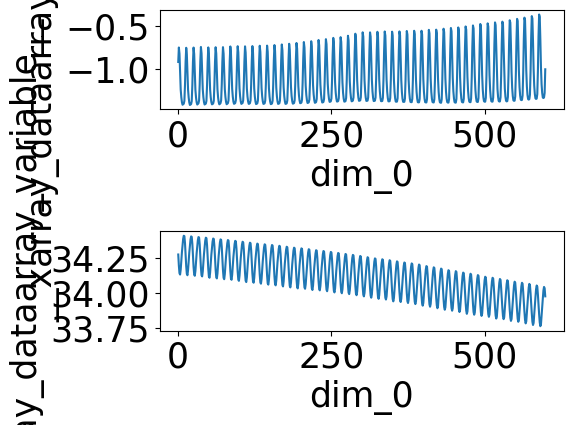

In [33]:
fig, ax = plt.subplots(nrows = 2)
(temp_ACoC_S.__xarray_dataarray_variable__ -273).plot(ax = ax[0])
salt_ACoC_S.__xarray_dataarray_variable__.plot(ax = ax[1])
plt.tight_layout()

In [38]:
temp_ASC_N = xr.concat([xr.open_mfdataset('temp_N30_ASC_N_t0_200.nc'), \
    xr.open_mfdataset('temp_N30_ASC_N_t200_400.nc'), \
    xr.open_mfdataset('temp_N30_ASC_N_t400_600.nc')], dim = 'dim_0')
salt_ASC_N = xr.concat([xr.open_mfdataset('salt_N30_ASC_N_t0_200.nc'),\
    xr.open_mfdataset('salt_N30_ASC_N_t200_400.nc'), \
    xr.open_mfdataset('salt_N30_ASC_N_t400_600.nc')], dim = 'dim_0')

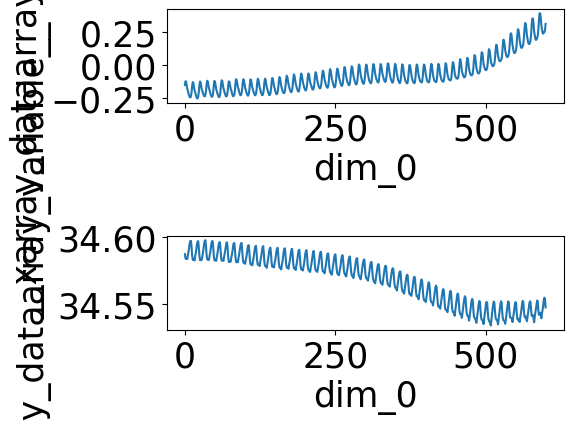

In [35]:
fig, ax = plt.subplots(nrows = 2)
(temp_ASC_N.__xarray_dataarray_variable__ -273).plot(ax = ax[0])
salt_ASC_N.__xarray_dataarray_variable__.plot(ax = ax[1])
plt.tight_layout()

In [39]:
temp_ASC_ACoC = xr.concat([xr.open_mfdataset('temp_N30_ASC_AcoC_t0_200.nc'), \
    xr.open_mfdataset('temp_N30_ASC_AcoC_t200_600.nc')], dim = 'dim_0')
salt_ASC_ACoC = xr.concat([xr.open_mfdataset('salt_N30_ASC_AcoC_t0_200.nc'),\
    xr.open_mfdataset('salt_N30_ASC_AcoC_t200_400.nc'), \
    xr.open_mfdataset('salt_N30_ASC_AcoC_t400_600.nc')], dim = 'dim_0')

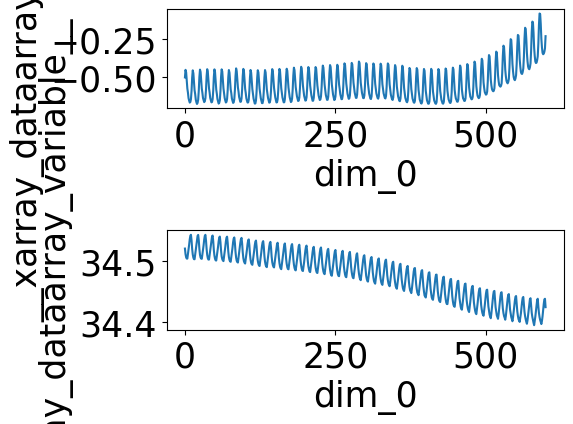

In [35]:
fig, ax = plt.subplots(nrows = 2)
(temp_ASC_ACoC.__xarray_dataarray_variable__ -273).plot(ax = ax[0])
salt_ASC_ACoC.__xarray_dataarray_variable__.plot(ax = ax[1])
plt.tight_layout()

In [40]:
## calculating gsw
#NB temp - conservative temp
temp = cc.querying.getvar(expt=expt, variable= 'temp', 
                              session=session, frequency='1 monthly', \
                             chunks = {'st_ocean': 80,  'yt_ocean':500, 'xt_ocean':3600})\
            .sel(yt_ocean = slice(-79,-60))* cluster_mask_access
salt = cc.querying.getvar(expt=expt, variable= 'salt', 
                              session=session, frequency='1 monthly', \
                             chunks = {'st_ocean': 80,  'yt_ocean':500, 'xt_ocean':3600})\
            .sel(yt_ocean = slice(-79,-60)) * cluster_mask_access


In [41]:
temp

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 285GB
dask.array<mul, shape=(600, 75, 440, 3600), dtype=float32, chunksize=(1, 75, 440, 3600), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00

In [130]:
from cosima_cookbook import explore
ee= explore.ExperimentExplorer(session=session)
ee

ExperimentExplorer(children=(HTML(value='\n            <h3>Experiment Explorer</h3>\n\n            <p>Select a…

In [42]:
import gsw

In [104]:
p = gsw.p_from_z(-st_ocean, area_t.yt_ocean)

In [131]:
SA = gsw.SA_from_SP(salt, p, area_t.xt_ocean, area_t.yt_ocean)
## absolute salinity from practical salinity

In [132]:
SA

<xarray.DataArray (time: 600, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 570GB
dask.array<sa_from_sp, shape=(600, 75, 440, 3600), dtype=float64, chunksize=(1, 75, 440, 3600), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00

In [168]:
A = gsw.alpha(SA, temp - 273,p)
alpha_field_xy = (A*thickness).sum('st_ocean')/thickness.sum('st_ocean')
val = (alpha_field_xy*area_t.where(cluster_mask_access == True)).sum(dim = ('xt_ocean','yt_ocean'))\
    /area_t.where(cluster_mask_access == True).sum(dim = ('xt_ocean','yt_ocean'))
val

<xarray.DataArray (time: 600)> Size: 5kB
dask.array<truediv, shape=(600,), dtype=float64, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00

In [169]:
%%time
val.mean('time').values # depth average alpha for studied region

CPU times: user 4min 9s, sys: 19.3 s, total: 4min 28s
Wall time: 10min 5s


array(5.36631889e-05)

In [170]:
%%time
B = gsw.beta(SA, temp - 273,p)
beta_field_xy = (B*thickness).sum('st_ocean')/thickness.sum('st_ocean')
val_beta = (beta_field_xy*area_t.where(cluster_mask_access == True)).sum(dim = ('xt_ocean','yt_ocean'))\
    /area_t.where(cluster_mask_access == True).sum(dim = ('xt_ocean','yt_ocean'))
val_beta.mean('time').values

CPU times: user 3min 54s, sys: 16.8 s, total: 4min 11s
Wall time: 7min 30s


array(0.00077809)

### Gsw testing

In [ ]:
%%time
## shelf
A = gsw.alpha(SA, temp - 273,p) *cluster_mask_shelfwcanyons_t
alpha_field_xy = (A*thickness).sum('st_ocean')/thickness.sum('st_ocean')
val = (alpha_field_xy*area_t).sum(dim = ('xt_ocean','yt_ocean'))/area_t.sum(dim = ('xt_ocean','yt_ocean'))
val.mean('time').values

In [ ]:
%%time
# shelf
B = gsw.beta(SA, temp - 273,p) *cluster_mask_shelfwcanyons_t
beta_field_xy = (B*thickness).sum('st_ocean')/thickness.sum('st_ocean')
val_beta = (beta_field_xy*area_t).sum(dim = ('xt_ocean','yt_ocean'))/area_t.sum(dim = ('xt_ocean','yt_ocean'))
val_beta.mean('time').values

In [156]:
%%time
## slope
A = gsw.alpha(SA, temp - 273,p)
alpha_field_xy = (A.where(~cluster_mask_shelfwcanyons_t == True)*thickness).sum('st_ocean')/thickness.sum('st_ocean')
val = (alpha_field_xy*area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True)).sum(dim = ('xt_ocean','yt_ocean'))\
    /area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True).sum(dim = ('xt_ocean','yt_ocean'))
val.mean('time').values

CPU times: user 3min 32s, sys: 17.2 s, total: 3min 49s
Wall time: 8min 28s


array(7.7841671e-05)

In [159]:
%%time
# slope
B = gsw.beta(SA, temp - 273,p)
beta_field_xy = (B.where(~cluster_mask_shelfwcanyons_t == True)*thickness).sum('st_ocean')/thickness.sum('st_ocean')
val_beta = (beta_field_xy*area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True)).sum(dim = ('xt_ocean','yt_ocean'))\
    /area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True).sum(dim = ('xt_ocean','yt_ocean'))
val_beta.mean('time').values

CPU times: user 4min 15s, sys: 19.2 s, total: 4min 34s
Wall time: 9min 32s


array(0.00076975)

In [ ]:
%%time
## shelf surf
A = gsw.alpha(SA, temp - 273,p) *cluster_mask_shelfwcanyons_t
alpha_field_xy = A.isel(st_ocean = 0)
val = (alpha_field_xy*area_t).sum(dim = ('xt_ocean','yt_ocean'))/area_t.sum(dim = ('xt_ocean','yt_ocean'))
val.mean('time').values

In [ ]:
%%time
# shelfsurf
B = gsw.beta(SA, temp - 273,p) *cluster_mask_shelfwcanyons_t
beta_field_xy = B.isel(st_ocean = 0)
val_beta = (beta_field_xy*area_t).sum(dim = ('xt_ocean','yt_ocean'))/area_t.sum(dim = ('xt_ocean','yt_ocean'))
val_beta.mean('time').values

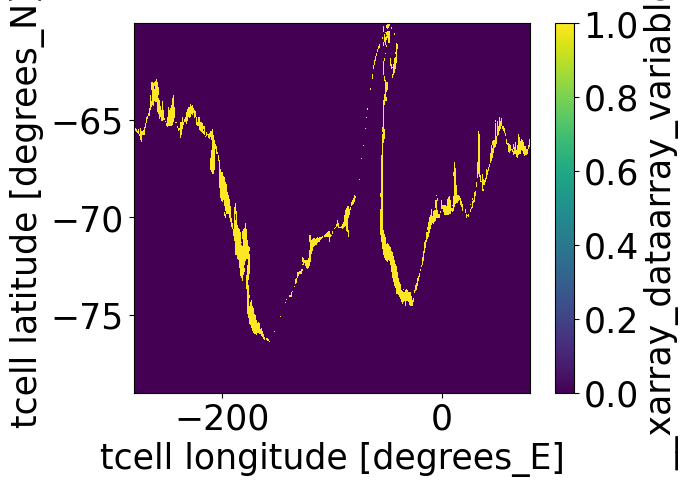

In [140]:
(~cluster_mask_shelfwcanyons_t*cluster_mask_access).plot()

In [150]:
%%time
## slopesurf
A = gsw.alpha(SA, temp - 273,p)
alpha_field_xy = A.isel(st_ocean = 0).where(~cluster_mask_shelfwcanyons_t == True)
val = (alpha_field_xy*area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True)).sum(dim = ('xt_ocean','yt_ocean'))\
    /area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True).sum(dim = ('xt_ocean','yt_ocean'))
val.mean('time').values

CPU times: user 2min 40s, sys: 7.14 s, total: 2min 47s
Wall time: 7min 59s


array(3.78872288e-05)

In [155]:
%%time
# slopesurf
B = gsw.beta(SA, temp - 273,p)
beta_field_xy = B.isel(st_ocean = 0).where(~cluster_mask_shelfwcanyons_t == True)
val_beta = (beta_field_xy*area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True)).sum(dim = ('xt_ocean','yt_ocean'))\
    /area_t.where(~cluster_mask_shelfwcanyons_t == True).where(cluster_mask_access == True).sum(dim = ('xt_ocean','yt_ocean'))
val_beta.mean('time').values

CPU times: user 3min 18s, sys: 13.1 s, total: 3min 31s
Wall time: 9min 52s


array(0.00078403)

In [43]:
from cosima_cookbook import explore
ee = explore.ExperimentExplorer(session=session)
ee

ExperimentExplorer(children=(HTML(value='\n            <h3>Experiment Explorer</h3>\n\n            <p>Select a…

In [ ]:
 cc.querying.getvar(expt=expt, variable= 'pressure', 
                              session=session, frequency='1 monthly')

## transport calculation

In [48]:
diff_temp_ASC_t = temp_ASC_ACoC.__xarray_dataarray_variable__ - temp_ASC_N.__xarray_dataarray_variable__
diff_temp_ACoC_t= temp_ACoC_S.__xarray_dataarray_variable__ - temp_ASC_ACoC.__xarray_dataarray_variable__
diff_salt_ASC_t= salt_ASC_ACoC.__xarray_dataarray_variable__ - salt_ASC_N.__xarray_dataarray_variable__
diff_salt_ACoC_t= salt_ACoC_S.__xarray_dataarray_variable__ - salt_ASC_ACoC.__xarray_dataarray_variable__

In [49]:
diff_temp_ASC_t = diff_temp_ASC_t.rename({'dim_0':'time'})
diff_temp_ACoC_t= diff_temp_ACoC_t.rename({'dim_0':'time'})
diff_salt_ASC_t= diff_salt_ASC_t.rename({'dim_0':'time'})
diff_salt_ACoC_t = diff_salt_ACoC_t.rename({'dim_0':'time'})

In [50]:
temp_ASC_ACoC = temp_ASC_ACoC.__xarray_dataarray_variable__.rename({'dim_0':'time'})
temp_ASC_N = temp_ASC_N.__xarray_dataarray_variable__.rename({'dim_0':'time'})
temp_ACoC_S = temp_ACoC_S.__xarray_dataarray_variable__.rename({'dim_0':'time'})
salt_ASC_ACoC = salt_ASC_ACoC.__xarray_dataarray_variable__.rename({'dim_0':'time'})
salt_ASC_N = salt_ASC_N.__xarray_dataarray_variable__.rename({'dim_0':'time'})
salt_ACoC_S = salt_ACoC_S.__xarray_dataarray_variable__.rename({'dim_0':'time'})

In [187]:
# constants
H_ASC = 1000 #[m]
H_ACoC = 200 # [m]
rho = 1035 #[kg/m3]'
alpha = 5.37e-5    # 5.36631889e-05# 3.7e-5 #[K^{-1}] #original 1e-4
beta = 7.78e-4 #   0.00077809# 7.8e-4 # [kg/g]  original 7.5e-4
g = 9.81 # [m/s]
f = -1.3e-4 #[s^{-1}]

'''
alpha_ASC = -1.75657888e-05
alpha_ACoC = -4.76721602e-06
beta_ASC = 7.29175605e-07
beta_ACoC = 1.53893568e-06
'''

'\nalpha_ASC = -1.75657888e-05\nalpha_ACoC = -4.76721602e-06\nbeta_ASC = 7.29175605e-07\nbeta_ACoC = 1.53893568e-06\n'

In [188]:
def param_test_calc(g,H,alpha,beta, f):
    return g*H**2/f *(-alpha  * -diff_temp_ASC_t + beta * -diff_salt_ASC_t)

In [189]:
def param_thermal_calc(g,H,alpha,beta, f):
    return g*H**2/f *(-alpha  * -diff_temp_ASC_t)

In [190]:
def param_salt_calc(g,H,alpha,beta, f):
    return g*H**2/f *( beta * -diff_salt_ASC_t)

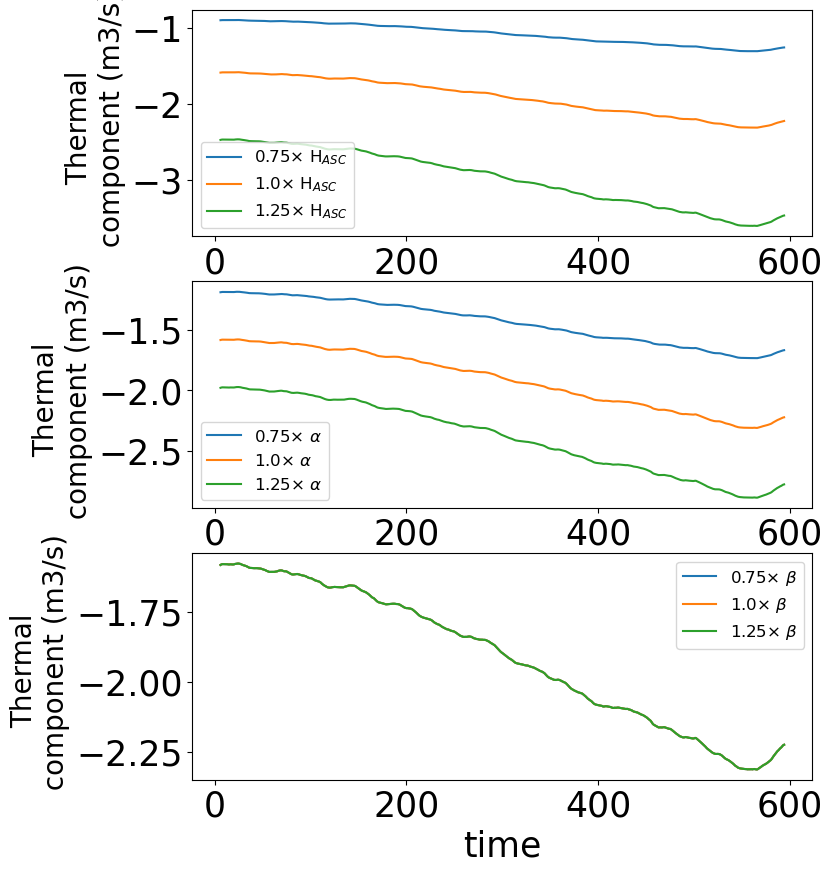

In [209]:
fig, ax = plt.subplots(nrows = 3, figsize = (8,10))

for i in np.arange(0.75,1.5,0.25):
    (-param_thermal_calc(g,H_ASC*i,alpha,beta, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[0], label = str(i) + r'$\times$ H$_{ASC}$')
    (-param_thermal_calc(g,H_ASC,alpha*i,beta, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[1], label = str(i) + r'$\times$ $\alpha$')
    (-param_thermal_calc(g,H_ASC,alpha,beta*i, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[2], label = str(i) + r'$\times$ $\beta$')
    #(-param_test_calc(g,H_ASC,alpha,beta, f*i)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[3], label = str(i) + r'$\times$ f')

for row in range(3):
    ax[row].set_ylabel('Thermal \n component (m3/s)', fontsize = 20)
    ax[row].legend(fontsize = 12)


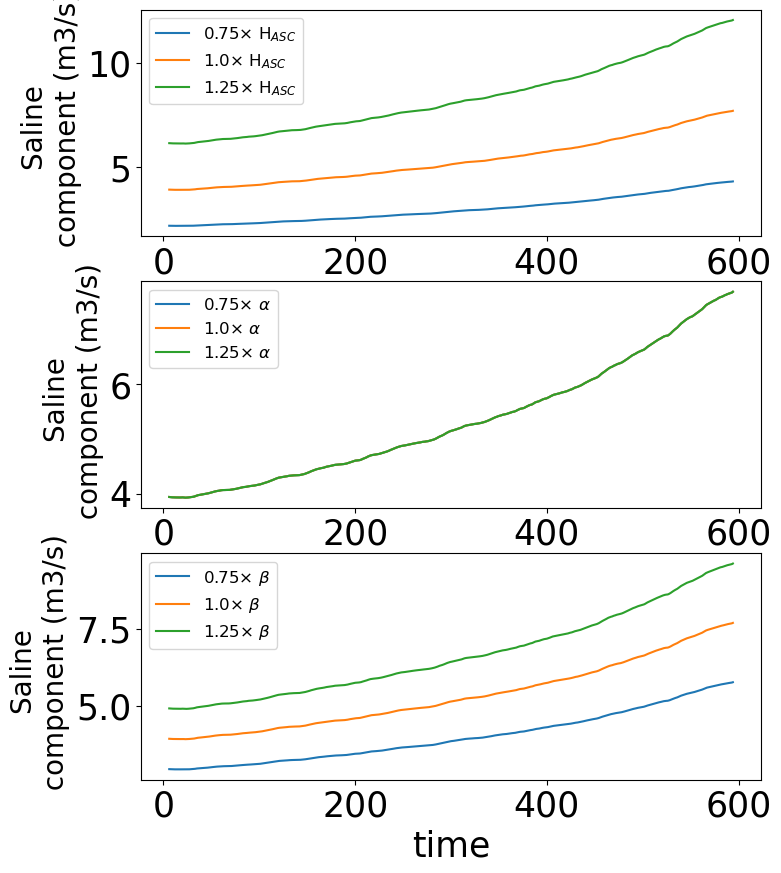

In [208]:
fig, ax = plt.subplots(nrows = 3, figsize = (8,10))

for i in np.arange(0.75,1.5,0.25):
    (-param_salt_calc(g,H_ASC*i,alpha,beta, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[0], label = str(i) + r'$\times$ H$_{ASC}$')
    (-param_salt_calc(g,H_ASC,alpha*i,beta, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[1], label = str(i) + r'$\times$ $\alpha$')
    (-param_salt_calc(g,H_ASC,alpha,beta*i, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[2], label = str(i) + r'$\times$ $\beta$')
    #(-param_test_calc(g,H_ASC,alpha,beta, f*i)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[3], label = str(i) + r'$\times$ f')

for row in range(3):
    ax[row].set_ylabel('Saline \n component (m3/s)', fontsize = 20)
    ax[row].legend(fontsize = 12)


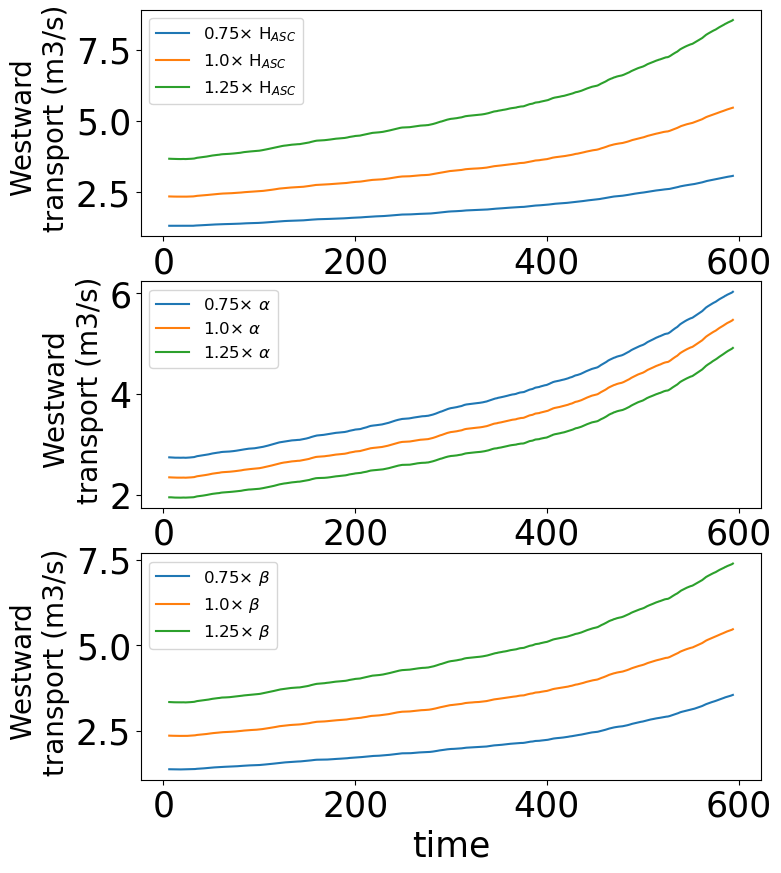

In [207]:
fig, ax = plt.subplots(nrows = 3, figsize = (8,10))

for i in np.arange(0.75,1.5,0.25):
    (-param_test_calc(g,H_ASC*i,alpha,beta, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[0], label = str(i) + r'$\times$ H$_{ASC}$')
    (-param_test_calc(g,H_ASC,alpha*i,beta, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[1], label = str(i) + r'$\times$ $\alpha$')
    (-param_test_calc(g,H_ASC,alpha,beta*i, f)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[2], label = str(i) + r'$\times$ $\beta$')
    #(-param_test_calc(g,H_ASC,alpha,beta, f*i)/1e6).rolling(time = 12, center = True).mean().plot(ax = ax[3], label = str(i) + r'$\times$ f')

for row in range(3):
    ax[row].set_ylabel('Westward \n transport (m3/s)', fontsize = 20)
    ax[row].legend(fontsize = 12)


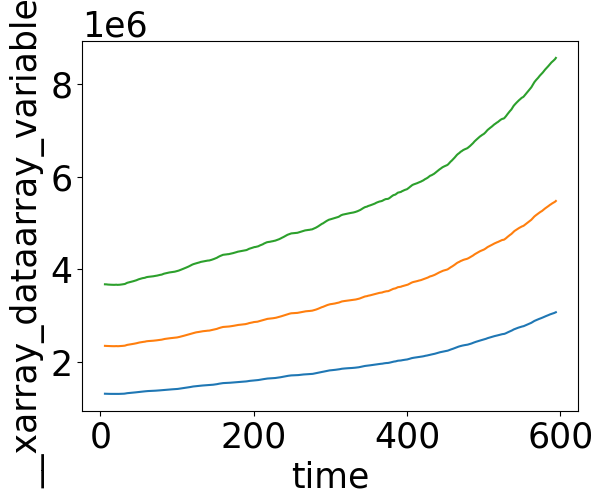

In [194]:
T_ASC_750 = g*750**2/f *(-alpha  * -diff_temp_ASC_t + beta * -diff_salt_ASC_t)
T_ASC_1000 = g*1000**2/f *(-alpha  * -diff_temp_ASC_t + beta * -diff_salt_ASC_t)
T_ASC_1250 = g*1250**2/f *(-alpha  * -diff_temp_ASC_t + beta * -diff_salt_ASC_t)
(-T_ASC_750).rolling(time = 12, center = True).mean().plot()
(-T_ASC_1000).rolling(time = 12, center = True).mean().plot()
(-T_ASC_1250).rolling(time = 12, center = True).mean().plot()

alpha_ASC = 
alpha_ACoC = -1e-4
beta_ASC = 
beta_ACoC = 1e-4

In [197]:
T_ASC = g*H_ASC**2/f *(-alpha  * -diff_temp_ASC_t + beta * -diff_salt_ASC_t)
T_ACoC = g*H_ACoC**2/f *(-alpha  * -diff_temp_ACoC_t + beta * -diff_salt_ACoC_t)
## salt diff calculates a S - N, minus signs to reverse
# in [Sv]

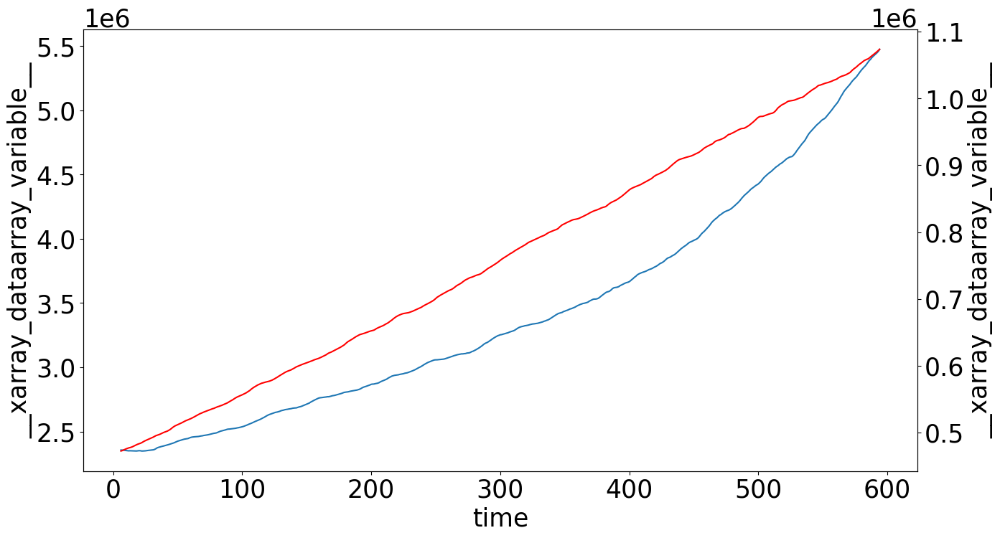

In [198]:
fig, ax = plt.subplots(figsize = (15,8))
(-T_ASC).rolling(time = 12, center = True).mean().plot()
#ax.set_ylim([5.92e8,5.98e8])
ax2 = ax.twinx()
(-T_ACoC).rolling(time = 12, center = True).mean().plot(color = 'r')
#ax2.set_ylim([2.56e6 ,2.56e6 + 0.06e8])


In [199]:
 temp_comp_ASC = g*H_ASC**2/f *(-alpha  * -diff_temp_ASC_t)
salt_comp_ASC = g*H_ASC**2/f *(beta * -diff_salt_ASC_t)
 temp_comp_ACoC = g*H_ACoC**2/f *(-alpha  * -diff_temp_ACoC_t)
salt_comp_ACoC = g*H_ACoC**2/f *(beta * -diff_salt_ACoC_t)

In [200]:
import cftime

In [201]:
from matplotlib.lines import Line2D
'''
legend_elements = [Line2D([0], [0], color=onshore_offshore_clr[0], lw=lw, label='Onshore ACoC'),
                  Line2D([0], [0], color=onshore_offshore_clr[1], lw=lw, label='ACoC and ASC boundary'),
                  Line2D([0], [0], color=onshore_offshore_clr[2], lw=lw, label='Offshore ASC')]

# Create the figure
fig, ax = plt.subplots()
ax.legend(handles=legend_elements, loc='center')
'''

"\nlegend_elements = [Line2D([0], [0], color=onshore_offshore_clr[0], lw=lw, label='Onshore ACoC'),\n                  Line2D([0], [0], color=onshore_offshore_clr[1], lw=lw, label='ACoC and ASC boundary'),\n                  Line2D([0], [0], color=onshore_offshore_clr[2], lw=lw, label='Offshore ASC')]\n\n# Create the figure\nfig, ax = plt.subplots()\nax.legend(handles=legend_elements, loc='center')\n"

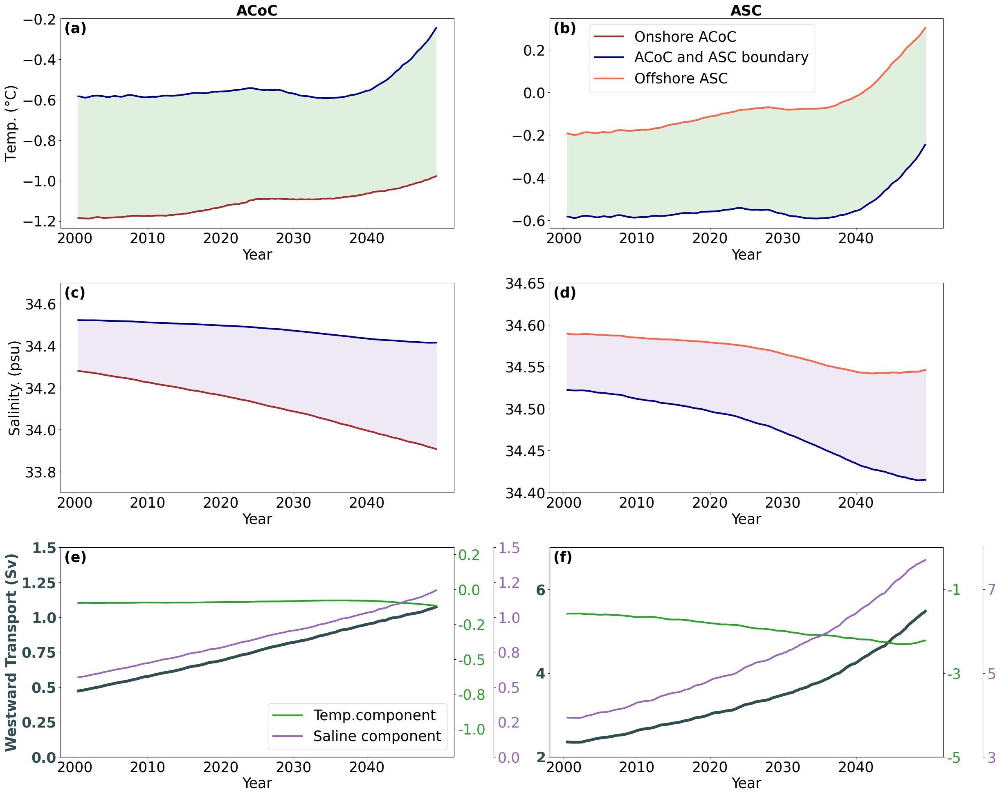

In [210]:
## master plot
lw = 3
#np.set_printoptions(precision=3)
from matplotlib.ticker import FormatStrFormatter

fig,ax = fig, ax = plt.subplot_mosaic("ab;cd;ef", figsize = (25,20))

onshore_offshore_clr = ['brown', 'darkblue', 'tomato']
total_color= 'darkslategrey'
legend_elements = [Line2D([0], [0], color=onshore_offshore_clr[0], lw=lw, label='Onshore ACoC'),
                  Line2D([0], [0], color=onshore_offshore_clr[1], lw=lw, label='ACoC and ASC boundary'),
                  Line2D([0], [0], color=onshore_offshore_clr[2], lw=lw, label='Offshore ASC')]

(temp_ACoC_S - 273).rolling(time = 12, center = True).mean().plot(\
                                    color = onshore_offshore_clr[0], ax = ax['a'], lw = lw)
(temp_ASC_ACoC- 273).rolling(time = 12, center = True).mean().plot(  \
                                      color = onshore_offshore_clr[1], ax = ax['a'], lw = lw)
ax['a'].fill_between(salt_ACoC_S.time.values, \
                     (temp_ACoC_S- 273).rolling(time = 12, center = True).mean().values,\
                     (temp_ASC_ACoC- 273).rolling(time = 12, center = True).mean().values, \
                     alpha = 0.15, color = 'C2')
ax['a'].set_title('ACoC', weight = 'bold')
#ax['a'].set_ylim([-1.3,-0.3])
ax['a'].set_ylabel(r'Temp. ($\degree$C)')
ax['b'].legend(handles=legend_elements, loc = (0.1,0.65))

(temp_ASC_ACoC- 273).rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[1], ax = ax['b'], lw = lw)
(temp_ASC_N- 273).rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[2],ax = ax['b'], lw = lw)

ax['b'].fill_between(temp_ASC_ACoC.time.values, \
                     (temp_ASC_ACoC- 273).rolling(time = 12, center = True).mean().values,\
                     (temp_ASC_N- 273).rolling(time = 12, center = True).mean().values,\
                     alpha = 0.15, color = 'C2')

ax['b'].set_title('ASC', weight = 'bold')

#ax['b'].set_ylim([-0.7,0.5])
ax['b'].set_ylabel('')
  
salt_ACoC_S.rolling(time = 12, center = True).mean().plot( color = onshore_offshore_clr[0],ax = ax['c'], lw = lw)
salt_ASC_ACoC.rolling(time = 12, center = True).mean().plot( color = onshore_offshore_clr[1],ax = ax['c'], lw = lw)
ax['c'].fill_between(salt_ACoC_S.time.values, salt_ACoC_S.rolling(time = 12, center = True).mean().values,\
                     salt_ASC_ACoC.rolling(time = 12, center = True).mean().values, alpha = 0.15, color = 'C4')
ax['c'].set_ylim([33.7,34.7])
ax['c'].set_ylabel('Salinity. (psu)')

salt_ASC_ACoC.rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[1],ax = ax['d'], lw = lw)
salt_ASC_N.rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[2], ax = ax['d'], lw = lw)
ax['d'].fill_between(salt_ASC_N.time.values, \
                     salt_ASC_N.rolling(time = 12, center = True).mean().values,\
                     salt_ASC_ACoC.rolling(time = 12, center = True).mean().values, alpha = 0.15, color = 'C4')
ax['d'].set_ylim([34.4,34.65])
ax['d'].set_ylabel('')


(-T_ACoC/1e6).rolling(time = 12, center = True).mean()\
    .plot(ax = ax['e'], label = 'ACoC depth-av', color = total_color, lw = 5)
ax2 = ax['e'].twinx()
ax['e'].set_ylim([0,1.5])

ax2.spines['right']
(-temp_comp_ACoC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C2', ax = ax2, lw = lw, label = 'Temp.component')
ax2.set_ylim([-1.2,0.3])
ax2.set_yticklabels(labels = ax2.get_yticks(), color = 'C2')
ax2.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax2.set_ylabel('')

ax3 = ax['e'].twinx()
ax3.spines['right'].set_position(('outward', 70))
ax3.set_ylim([0,1.5])
(-salt_comp_ACoC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C4', ax = ax3, lw = lw, label = 'Saline component')
ax3.set_yticklabels(labels = ax3.get_yticks(), color = 'C4')
ax3.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax3.set_ylabel('', color= 'C4')

ax['e'].set_yticklabels(labels = ax['e'].get_yticks(), color = total_color, fontweight = 'bold')
ax['e'].set_ylabel('Westward Transport (Sv)', color = total_color, fontweight = 'bold')

### Do everything for plot4 as before
handles4,labels4 = ax2.get_legend_handles_labels()
### Do everything for plot4a
handles4a,labels4a = ax3.get_legend_handles_labels()
### Combine the legend handles and labels to make a new legend object
handles = handles4 + handles4a
labels = labels4 + labels4a


(-T_ASC/1e6).rolling(time = 12, center = True).mean()\
    .plot( label = 'ASC depth-av', ax = ax['f'], lw = 5,color = total_color,ylim = (2,7))
ax['f'].set_yticks(range(2,7,2))
ax['f'].set_yticklabels(labels =  ax['f'].get_yticks(), color = total_color, fontweight = 'bold')
ax['f'].set_ylabel('')

ax4 = ax['f'].twinx()
(-temp_comp_ASC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C2', ax = ax4, lw = lw, ylim = (-5,0))
ax4.set_yticks(range(-5,0,2))
ax4.set_yticklabels(labels = ax4.get_yticks(), color = 'C2')
ax4.set_ylabel('')

ax5 = ax['f'].twinx()
ax5.spines['right'].set_position(('outward', 70))
ax5.set_yticks(range(3,8,2))
(-salt_comp_ASC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C4', ax = ax5, lw = lw, ylim = (3,8))
ax5.set_yticklabels(labels = ax5.get_yticks(), color = 'C4')
ax5.set_ylabel('')

for letter in list(map(chr, range(ord('a'), ord('f')+1))):
        ax[letter].set_xticks(salt_ASC_N.time[::120].values)
        ax[letter].set_xticklabels(np.arange(2000,2050,10))
        ax[letter].set_xlabel('Year')
        ax[letter].text(0.01,0.93,'(' + letter + ')', \
                        transform=ax[letter].transAxes, fontweight = 'bold')
ax['e'].legend(handles, labels, loc = 'lower right')

plt.tight_layout()

In [ ]:
#old

In [60]:
merge = np.hstack((weighted_avg_temp, weighted_avg_temp_2))
merge = np.hstack((weighted_avg_temp, weighted_avg_temp_2,weighted_avg_temp_3))

In [65]:
xr.DataArray(merge).to_netcdf('temp_ASC_AcoC_t0_200.nc')

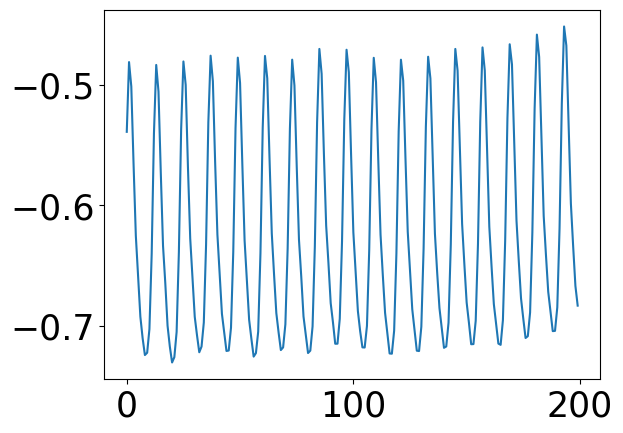

In [62]:
plt.plot(merge- 273)

In [ ]:
%%time
weighted_avg_salt = area_ave_quantity_Nkm_range('salt', within_N_km)

In [ ]:
weighted_avg_temp.to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/temp_ASC_ACoC_boundary_wcanyons.nc')
weighted_avg_salt.to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/salt_ASC_ACoC_boundary_wcanyons.nc')

## using ave of circles along a contour

In [33]:
#Haversine formula for distance between two points on Earth in km
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0  # Radius of the Earth in km
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    
    return R * c  # Distance in km

In [35]:
# Compute average within a radius for one point and one time step
def compute_average_for_point_time(lat_point, lon_point, lat_grid, lon_grid, var_grid_time, radius_km=30):
    # Compute distances from the point to all other grid points using the haversine formula
    distances = haversine(lat_point, lon_point, lat_grid, lon_grid)
    
    # Mask for points within the radius
    mask = distances <= radius_km
    
    # Calculate average of variable values within the radius for this time step
    if np.any(mask):
        return np.nanmean(var_grid_time[mask]*area_t[mask])/area_t[mask].sum() #np.nanmean(var_grid_time[mask])
    else:
        return np.nan  # Return NaN if no points are within the radius

In [36]:
# Parallel computation for all time steps and all points
def average_within_radius_parallel(lat_line, lon_line, lat_grid, lon_grid, var_grid, radius_km=30):
    '''
    lat_line/lon_line are the lat and lon values along your line (1D)
    lon_grid, lat_grid = np.meshgrid(var.xt_ocean, var.yt_ocean)
    var_grid is your variable in 3D (time, lat, lon)
    '''
    coord_time = var_grid.time.values
    var_grid = var_grid.values
    
    # Define parallel function to compute for each time step and point in parallel
    def parallel_task(time_index, lat_point, lon_point):
        return compute_average_for_point_time(
            lat_point, lon_point, lat_grid, lon_grid, var_grid[time_index, :, :], radius_km)

    # Generate all tasks for parallel execution
    tasks = [(t, depth, lat, lon) for t in range(var_grid.shape[0]) for depth in range(var_grid.shape[1]) for lat, lon in zip(lat_line, lon_line)]

    # Perform parallel computation (for both time and spatial points)
    results = Parallel(n_jobs=-1)(delayed(parallel_task)(t, lat, lon) for t, lat, lon in tasks)
    
    # Reshape the result to be 2D (time, number of points on the line)
    num_times = var_grid.shape[0]
    num_points = len(lat_line)

    da = np.array(results).reshape(num_times, num_points)
    da = xr.DataArray(da[:, :-1], dims=['time', 'distance'],
                      coords={'time': coord_time, 'distance': dist_cum_line})
    return da


In [37]:
lon_grid, lat_grid = np.meshgrid(area_t.xt_ocean.data, area_t.yt_ocean.data)

In [1]:

%%time
var_grid = cc.querying.getvar(expt=expt, variable= 'temp', 
                          session=session, frequency='1 monthly', chunks = {'time': 100, 'st_ocean':40, 'yt_ocean':250, 'xt_ocean':1200})\
        .sel(yt_ocean = slice(-79,-60)).isel(time = slice(0))#.load()#.chunk({'time': 100, 'yt_ocean':250, 'xt_ocean':1200}).load()
var_grid

NameError: name 'cc' is not defined

In [ ]:
da = average_within_radius_parallel(lat_line[0], lon_line[0], lat_grid, lon_grid, var_grid, radius_km=30)
da

In [48]:
var_grid

<xarray.DataArray 'temp' (time: 100, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 48GB
dask.array<getitem, shape=(100, 75, 440, 3600), dtype=float32, chunksize=(3, 40, 240, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 800B 2110-01-16 12:00:00 ... 2118-04-16 00:00:00
Attributes:
    long_name:      Conservative temperature
    units:          K
    valid_range:    [-10. 500.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  sea_water_conservative_temperature
    ncfiles:        ['/g/data/cj50/access-om2/raw-output/access-om2-01/01deg_...

## old circle code

In [246]:
from sklearn.neighbors import BallTree

In [253]:
np.radians(coords)

array([-1.33378172, -2.71835031])

In [269]:
radius_mask = boundary_mask_da.where(cluster_mask_access == True)
sel_radius = 1e5 #[m]
radius = sel_radius / 6371e3 #earth_radius [m]

#area_circ = 5e3**2 * np.pi
for idx_count in range(1):
    lat = area_t.yt_ocean.isel(yt_ocean =  bound_idx[0][idx_count])
    lon = area_t.xt_ocean.isel(xt_ocean = bound_idx[1][idx_count])
    coords =  [[lat,lon]]
    tree = BallTree(np.radians(coords), leaf_size=10, metric='haversine')
    tree_r = tree.query_radius( np.radians(coords), r=radius, count_only=True)
    

TypeError: loop of ufunc does not support argument 0 of type DataArray which has no callable radians method

In [268]:
tree_r

array([1])

In [245]:
area_circ

78539816.33974482

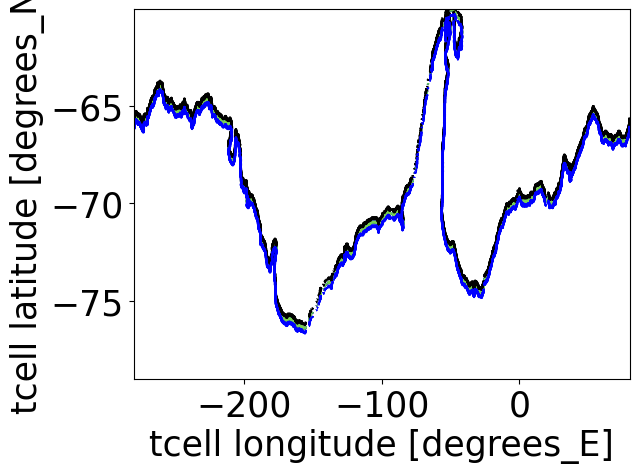

In [69]:
boundary_mask_da.where(cluster_mask_access == True).plot.contour()
(boundary_mask_da.where(cluster_mask_access == True)*1).shift(yt_ocean = 5).plot.contour(cmap = 'k')
(boundary_mask_da.where(cluster_mask_access == True)*1).shift(yt_ocean = -5).plot.contour(cmap = 'b')

#(boundary_mask_da*1).shift(yt_ocean = 5).plot.contour()

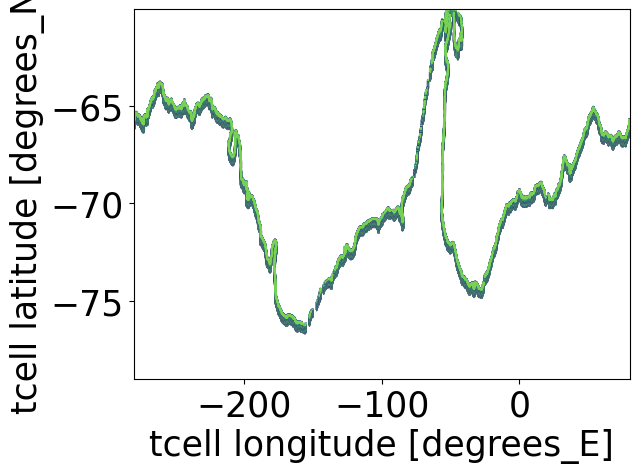

In [193]:
## stacking masks for boundary
boundary_region = boundary_mask_da.where(cluster_mask_access == True)

for i in range(-5,5): #saved data as -2,2
    arr = (boundary_mask_da.where(cluster_mask_access == True)*1).shift(yt_ocean = i)    
    boundary_region = boundary_region + (arr)
    arr.plot.contour()
#boundary_range_mask = xr.combine_first(boundary_region)


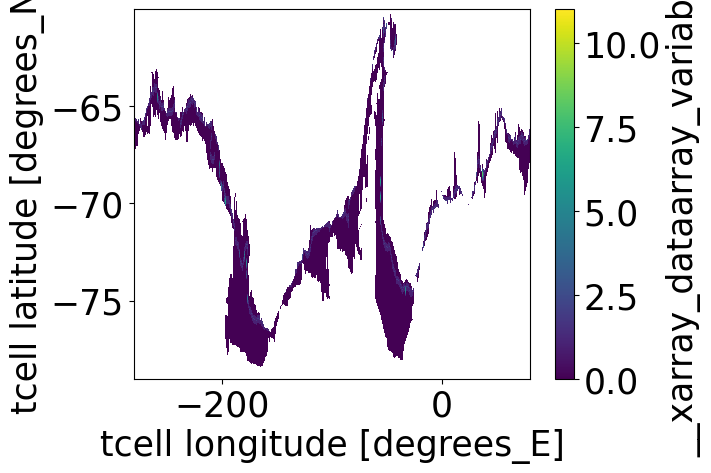

In [194]:
boundary_region.plot()

In [195]:
boundary_range_mask = boundary_region > 0

In [196]:
ht.where(boundary_range_mask == True).mean().values

array(1024.8257, dtype=float32)

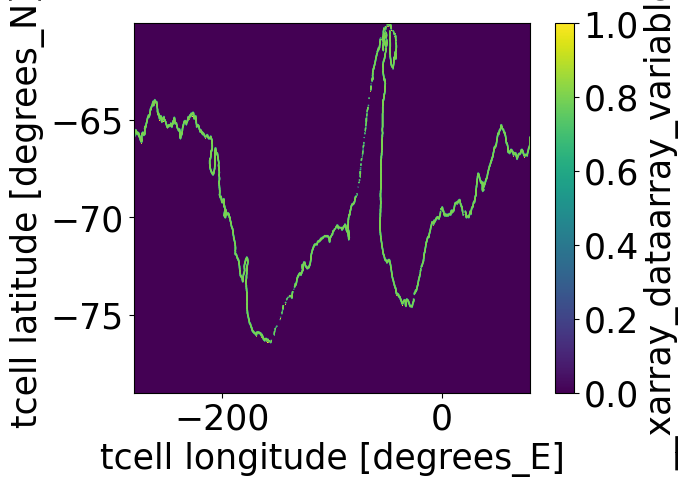

In [110]:
boundary_range_mask.plot()
boundary_mask_da.where(cluster_mask_access == True).plot.contour(linewidths = 1)

In [115]:
boundary_cellarea = area_t.where(boundary_range_mask == True).sum(dim = ['xt_ocean','yt_ocean'])

In [117]:
boundary_cellarea.values

array(2.7477393e+11, dtype=float32)

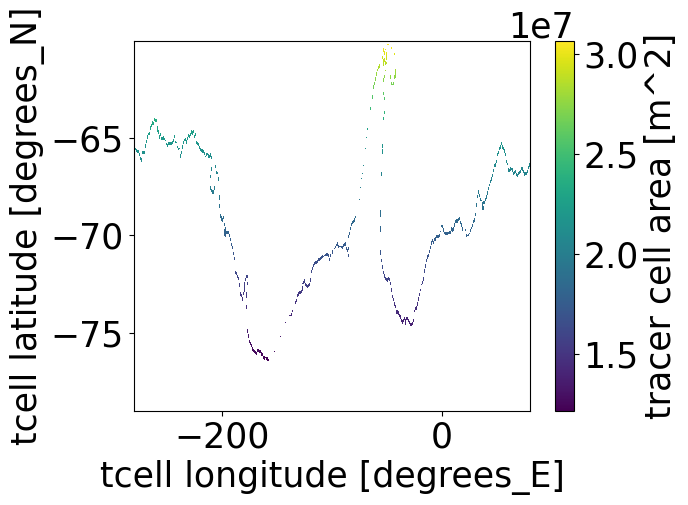

In [114]:
area_t.where(boundary_range_mask == True).plot()

In [200]:
## withing radius of n 
boundary_mask_da 

<xarray.DataArray '__xarray_dataarray_variable__' (yt_ocean: 440, xt_ocean: 3600)> Size: 2MB
dask.array<bitwise_xor, shape=(440, 3600), dtype=bool, chunksize=(440, 3600), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05

## hide previous delayed tests

In [270]:
import dask.array as da
from dask import delayed

# Function to compute the distance from the boundary
@delayed
def compute_distance(i, j, boundary_mask, max_distance):
    #max_distance: number of grid cells away
    if boundary_mask[i, j]:
        print('boundary found, row = ' + j)
        return 0  # Boundary points are distance 0
    else:
        # Calculate the distance to the nearest True value
        print('calc dist')
        distances = np.abs(np.array(np.where(boundary_mask)) - np.array([i, j]).reshape(2, 1))
        print('done dist')       
        return np.min(distances, axis=1).max()


In [271]:
cluster_mask_shelfwcanyons_t.shape[0]

440

In [272]:
%%time
# DELAYER Fill the distance array in parallel
#distance_array = np.empty(cluster_mask_shelfwcanyons_t.shape, dtype=int)
#distance_array = np.ones(cluster_mask_shelfwcanyons_t.shape, dtype=int)*np.nan
max_distance = 10
ARR =[]
futures = []
for i in range(10,cluster_mask_shelfwcanyons_t.shape[0]):# <-- this is ok
    for j in range(cluster_mask_shelfwcanyons_t.shape[1]):
        if j % 100 == 0:
            print(i,j)
        dist_elem = compute_distance(i, j, boundary_mask, max_distance)
        futures.append(dist_elem)
    print('persist')    
    distance_results = dask.persist(*futures)
    print('compute')
    result =  dask.compute(*distance_results)
    print('computed')
    ARR.append(result)

10 0
10 100
10 200
10 300
10 400
10 500
10 600
10 700
10 800
10 900
10 1000
10 1100
10 1200
10 1300
10 1400
10 1500
10 1600
10 1700
10 1800
10 1900
10 2000
10 2100
10 2200
10 2300
10 2400
10 2500
10 2600
10 2700
10 2800
10 2900
10 3000
10 3100
10 3200
10 3300
10 3400
10 3500
persist
compute
calc dist
calc dist
calc dist
calc dist
done dist
calc dist
done dist
done dist
done dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
done dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
calc dist
calc dist
done dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
done dist
calc dist
done dist
calc dis

2024-10-22 14:20:39,164 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 12.53 GiB -- Worker memory limit: 17.88 GiB
2024-10-22 14:20:45,980 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-10-22 14:20:49,215 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 12.53 GiB -- Worker memory limit: 17.88 GiB


KeyboardInterrupt: 

Process Dask Worker process (from Nanny):
2024-10-22 14:20:52,293 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2024-10-22 14:20:52,294 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-10-22 14:20:52,294 - distributed.nanny - ERROR - Worker process died unexpectedly
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/compatibility.py", line 236, in asyncio_run
    return loop.run_until_complete(main)
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/asyncio/base_events.py", line 636, in run_until_complete
    self.run_forever()
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/

calc dist
done dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
calc dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
calc dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
calc dist
done dist
calc dist
done dist
calc dist
calc dist
done dist
done dist
calc dist
calc dist
done dist
done dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
calc dist
done dist
done dist
done dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
done dist
calc dist
calc dist
done dist
done dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
calc dist
calc dist
calc dist
calc dist
done dist
done dist
done dist
done dist
calc dist
done dist
calc dist
calc dist
done dist
done dist
calc dist
calc dist
done dist
done dist
calc dist
done dist
calc dist
calc dist
calc dist
done dist


2024-10-22 14:21:07,676 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('array-996f62f61c28ba8f9db062cbda5e9d09', 0, 0))" coro=<Worker.execute() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/worker_state_machine.py:3615>> ended with CancelledError
2024-10-22 14:21:07,676 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute('original-open_dataset-__xarray_dataarray_variable__-5bbd6533f853269e4923c51c09e7622c')" coro=<Worker.execute() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/worker_state_machine.py:3615>> ended with CancelledError


In [ ]:
ARR

In [63]:
import dask

In [66]:
futures2 = futures[:100]
futures2

[Delayed('compute_distance-88ca9bda-1d93-4686-a28a-fff3273b97f8'),
 Delayed('compute_distance-bde28ec9-7e0f-4323-98d5-0bbb36f269d8'),
 Delayed('compute_distance-b1fcb11b-c502-43e6-8e90-15d43d69cdb6'),
 Delayed('compute_distance-f2c4a5b3-96f4-4d74-90ed-892dcdf72864'),
 Delayed('compute_distance-e6f3dd29-24e9-445b-a524-72dc507a3219'),
 Delayed('compute_distance-325ff8dc-e12e-4a97-bc04-9cebe632a433'),
 Delayed('compute_distance-a83a9d37-a668-4aa3-b636-108beed488c4'),
 Delayed('compute_distance-f9ee6cfd-23ef-42e5-9252-3f6f05a31f78'),
 Delayed('compute_distance-7643d62d-7f00-4cfe-ab76-f9af86d781fe'),
 Delayed('compute_distance-71c850ea-1bcf-4e78-a82d-70ddd6a925f0'),
 Delayed('compute_distance-95d09657-0958-4f62-a358-5d81c18ba29a'),
 Delayed('compute_distance-e5bb2f79-18fc-43e6-b39a-1ed5980e5923'),
 Delayed('compute_distance-2f3a6faa-e4db-43fe-901a-54697bd3ea88'),
 Delayed('compute_distance-29c3d7af-ae2f-478d-88b4-016afb801db8'),
 Delayed('compute_distance-68bdc21e-9390-4689-876f-ab37312d999

In [67]:
%%time
# Compute the distances https://examples.dask.org/applications/embarrassingly-parallel.html
distance2_results = dask.persist(*futures2)


CPU times: user 55.5 ms, sys: 14.5 ms, total: 70 ms
Wall time: 64.6 ms


In [69]:
result =  dask.compute(*distance2_results)
result

(51,
 50,
 49,
 48,
 47,
 46,
 45,
 44,
 43,
 42,
 41,
 40,
 39,
 38,
 37,
 36,
 35,
 34,
 33,
 32,
 31,
 30,
 29,
 28,
 27,
 26,
 25,
 24,
 23,
 22,
 21,
 20,
 19,
 18,
 17,
 16,
 15,
 14,
 13,
 12,
 11,
 10,
 9,
 8,
 7,
 6,
 5,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3)

In [ ]:
%%time
# Compute the distances https://examples.dask.org/applications/embarrassingly-parallel.html
distance_results = dask.persist(*futures)

In [104]:
import gc
c.run(gc.collect)

{'tcp://10.6.129.26:32847': 56,
 'tcp://10.6.129.26:33191': 56,
 'tcp://10.6.129.26:34105': 56,
 'tcp://10.6.129.26:34429': 56,
 'tcp://10.6.129.26:34433': 56,
 'tcp://10.6.129.26:34965': 56,
 'tcp://10.6.129.26:35773': 56,
 'tcp://10.6.129.26:36139': 56,
 'tcp://10.6.129.26:36145': 56,
 'tcp://10.6.129.26:36979': 56,
 'tcp://10.6.129.26:37905': 56,
 'tcp://10.6.129.26:38907': 56,
 'tcp://10.6.129.26:39453': 56,
 'tcp://10.6.129.26:39543': 56,
 'tcp://10.6.129.26:39625': 56,
 'tcp://10.6.129.26:39757': 56,
 'tcp://10.6.129.26:40963': 56,
 'tcp://10.6.129.26:41379': 56,
 'tcp://10.6.129.26:41447': 56,
 'tcp://10.6.129.26:41605': 56,
 'tcp://10.6.129.26:42613': 56,
 'tcp://10.6.129.26:42971': 56,
 'tcp://10.6.129.26:43541': 56,
 'tcp://10.6.129.26:43999': 56,
 'tcp://10.6.129.26:44015': 56,
 'tcp://10.6.129.26:44275': 56,
 'tcp://10.6.129.26:44383': 56,
 'tcp://10.6.129.26:46019': 56,
 'tcp://10.6.129.34:32833': 56,
 'tcp://10.6.129.34:32935': 56,
 'tcp://10.6.129.34:33521': 56,
 'tcp://

In [ ]:
result_full =  dask.compute(*distance_results)


In [93]:
c

<Client: 'tcp://10.6.122.47:37109' processes=84 threads=84, memory=703.92 GiB>

In [83]:
%%time
futures_new = []
for j in range(cluster_mask_shelfwcanyons_t.shape[1]):
    for i in range(10,cluster_mask_shelfwcanyons_t.shape[0]):
        if i % 100 == 0:
            print(i,j)
#for parameters in input_params.values:
        future_new = c.submit(compute_distance, (i,j, boundary_mask, max_distance))
        futures_new.append(future_new)

100 0
200 0
300 0
400 0
100 1
200 1
300 1
400 1
100 2
200 2
300 2
400 2
100 3
200 3
300 3
400 3
100 4
200 4
300 4
400 4
100 5
200 5
300 5
400 5
100 6
200 6
300 6
400 6
100 7
200 7
300 7
400 7
100 8
200 8
300 8
400 8
100 9
200 9
300 9
400 9
100 10
200 10
300 10
400 10
100 11
200 11
300 11
400 11
100 12
200 12
300 12
400 12
100 13
200 13
300 13
400 13
100 14
200 14
300 14
400 14
100 15
200 15
300 15
400 15
100 16
200 16
300 16
400 16
100 17
200 17
300 17
400 17
100 18
200 18
300 18
400 18
100 19
200 19
300 19
400 19
100 20
200 20
300 20
400 20
100 21
200 21
300 21
400 21
100 22
200 22
300 22
400 22
100 23
200 23


Exception ignored in: <function Future.__del__ at 0x14e661f6b5b0>
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py", line 520, in __del__
    self.release()
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py", line 503, in release
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 225, in add_callback
    call_soon(self._run_callback, functools.partial(callback, *args, **kwargs))
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/asyncio/base_events.py", line 804, in call_soon_threadsafe
    self._write_to_self()
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/asyncio/selector_events.py", line 135, in _write_to_self
    csock.send(b'\0')
KeyboardInterrupt: 


KeyboardInterrupt: 

In [78]:
%%time 
results = c.gather(futures_new)


KeyboardInterrupt



In [47]:
%%time
# Fill the distance array in parallel
distance_array = np.empty(cluster_mask_shelfwcanyons_t.shape, dtype=int)
distance_array = np.ones(cluster_mask_shelfwcanyons_t.shape, dtype=int)*np.nan
max_distance = 10
#futures = []
bound = 0
for j in range(cluster_mask_shelfwcanyons_t.shape[1]):
    for i in range(10,cluster_mask_shelfwcanyons_t.shape[0]):
        print(i,j)

        dist_elem = compute_distance(i, j, boundary_mask, max_distance)
        
        if dist_elem == 0:
            bound = 100
            
        if dist_elem > max_distance & bound == 100:
            # when boundary has been reached and distance exceeds max distance
            print('nan')
            bound = 0
            break
        else:  
            distance_array[i,j] = dist_elem


10 0
calc dist
done dist
10 1
calc dist
done dist
10 2
calc dist
done dist
10 3
calc dist
done dist
10 4
calc dist
done dist
10 5
calc dist
done dist
10 6
calc dist
done dist
10 7
calc dist
done dist
10 8
calc dist
done dist
10 9
calc dist
done dist
10 10
calc dist
done dist
10 11
calc dist
done dist
10 12
calc dist
done dist
10 13
calc dist
done dist
10 14
calc dist
done dist
10 15
calc dist
done dist
10 16
calc dist
done dist
10 17
calc dist
done dist
10 18
calc dist
done dist
10 19
calc dist
done dist
10 20
calc dist
done dist
10 21
calc dist
done dist
10 22
calc dist
done dist
10 23
calc dist
done dist
10 24
calc dist
done dist
10 25
calc dist
done dist
10 26
calc dist
done dist
10 27
calc dist
done dist
10 28
calc dist
done dist
10 29
calc dist
done dist
10 30
calc dist
done dist
10 31
calc dist
done dist
10 32
calc dist
done dist
10 33
calc dist
done dist
10 34
calc dist
done dist
10 35
calc dist
done dist
10 36
calc dist
done dist
10 37
calc dist
done dist
10 38
calc dist
done d

2024-10-21 15:53:46,281 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('interp_right_to_center-rechunk-merge-transpose-interp_right_to_center_0-ca465e474f1ded22e1567f461681ec28', 0, 0))" coro=<Worker.execute() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/worker_state_machine.py:3615>> ended with CancelledError


KeyboardInterrupt: 

Process Dask Worker process (from Nanny):
2024-10-21 15:53:48,413 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2024-10-21 15:53:48,414 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2024-10-21 15:53:48,436 - distributed.nanny - ERROR - Worker process died unexpectedly
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/process.py", line 202, in _run
    target(*args, **kwargs)
  File "/g/d

In [ ]:

# Fill the distance array
for idx, distance in enumerate(distance_results):
    i = idx // data.shape[1]
    j = idx % data.shape[1]
    distance_array[i, j] = distance

# Convert to xarray DataArray
distance_da = xr.DataArray(distance_array, dims=data.dims, coords=data.coords)

In [ ]:
boundary_mask

In [ ]:
%%time
# Create an array to store distances
distance_array = np.zeros(cluster_mask_shelfwcanyons_t.shape, dtype=int)

# Fill the distance array
for i in range(cluster_mask_shelfwcanyons_t.shape[0]):
    for j in range(cluster_mask_shelfwcanyons_t.shape[1]):
        if boundary_mask[i, j]:
            distance_array[i, j] = 0  # Boundary points are distance 0
        else:
            # Calculate the distance to the nearest True value
            distance_array[i, j] = np.min(np.abs(np.array(np.where(boundary_mask)) - np.array([i, j]).reshape(2, 1)), axis=1).max()

# Convert distance_array to xarray DataArray
distance_da = xr.DataArray(distance_array, dims=data.dims, coords=cluster_mask_shelfwcanyons_t.coords)


In [ ]:

# Define the maximum distance from the boundary
max_distance = 1  # Change this value as needed

# Create a mask for points within max_distance from the boundary
selection_mask = distance_da <= max_distance

# Select the values based on the mask
selected_values = cluster_mask_shelfwcanyons_t.where(selection_mask)

In [105]:
cluster_mask_shelfwcanyons_bool = xr.where(cluster_mask_shelfwcanyons != 0, True, False)

In [77]:
cluster_mask_shelfwcanyons_bool = cluster_mask_shelfwcanyons != 0

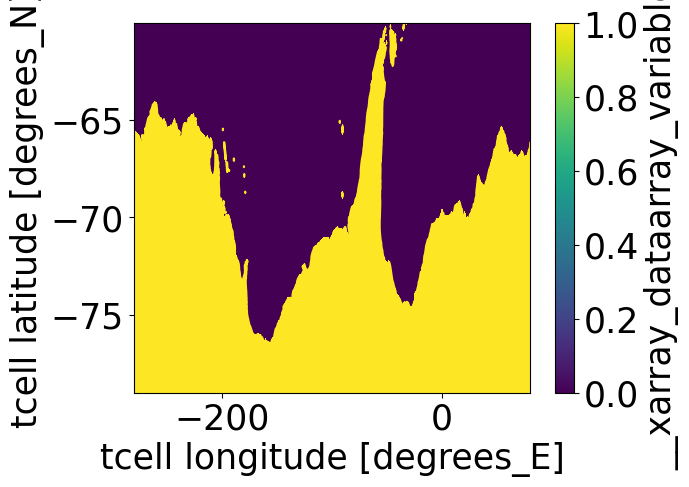

In [110]:
cluster_mask_shelfwcanyons_t.plot()
ht.plot.contour(levels = [600])

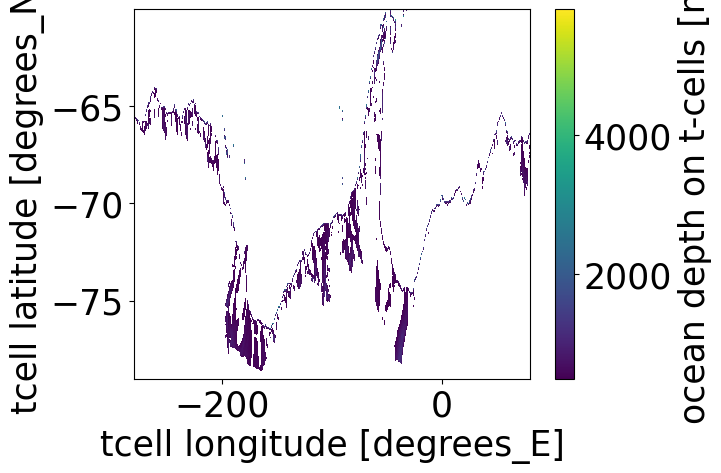

In [111]:
ht.where(cluster_mask_shelfwcanyons_t == True ).where(ht>500).plot()

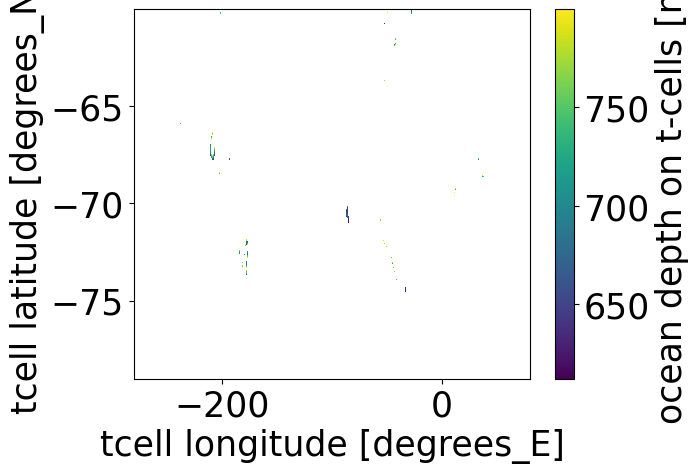

In [112]:
ht.where(cluster_mask_shelfwcanyons_t == False ).where(ht<800).plot()

In [108]:
cluster_mask_shelfwcanyons_t

<xarray.DataArray '__xarray_dataarray_variable__' (yt_ocean: 440, xt_ocean: 3600)> Size: 2MB
dask.array<transpose, shape=(440, 3600), dtype=bool, chunksize=(440, 3600), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05

In [86]:
cluster_mask_shelfwcanyons_t.values

array([[0.5 , 0.5 , 0.5 , ..., 0.5 , 0.5 , 0.5 ],
       [0.5 , 0.5 , 0.5 , ..., 0.5 , 0.5 , 0.5 ],
       [0.5 , 0.5 , 0.5 , ..., 0.5 , 0.5 , 0.5 ],
       ...,
       [0.5 , 0.5 , 0.5 , ..., 0.  , 0.5 , 0.5 ],
       [0.5 , 0.5 , 0.5 , ..., 0.25, 0.5 , 0.5 ],
       [0.5 , 0.5 , 0.5 , ..., 0.5 , 0.5 , 0.5 ]])

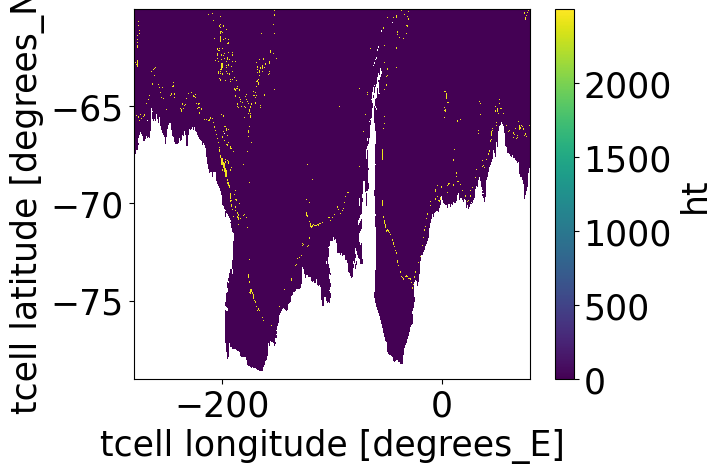

In [87]:
mask_500_1000 = xr.where((ht < 600) & (ht >500 ), True, False) 
mask_0_500 = xr.where( ht < 200 , True, False) 
mask_1500_2000 = xr.where((ht < 2500) & (ht > 2400), True, False) 
mask_1000_1500 = xr.where((ht < 700) & (ht > 600), True, False) 

(mask_1500_2000*ht).plot()
## this does not really look representative of the southern edge of the ASC,
## BUT this is also no different from computing circumpolar ave by isobath and selecting range!

## Checking isobath range for ASC/ACOC boundaries

In [25]:
ualong_decademean_wthmp = xr.open_mfdataset('/g/data/v45/qo9901/MW-perturb-ASC-data/ualong_decademean_' + exp_wthmp + '.nc')
ualong_decademean_wthp = xr.open_mfdataset('/g/data/v45/qo9901/MW-perturb-ASC-data/ualong_decademean_' + exp_wthp + '.nc')
ualong_decademean_ctrl = xr.open_mfdataset('/g/data/v45/qo9901/MW-perturb-ASC-data/ualong_decademean_' + exp_ctrl + '.nc')
ualong_decademean_wthmp

<xarray.Dataset> Size: 76MB
Dimensions:   (xu_ocean: 3600, yu_ocean: 440, decade: 5)
Coordinates:
  * xu_ocean  (xu_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.8 79.9 80.0
  * yu_ocean  (yu_ocean) float64 4kB -78.98 -78.93 -78.89 ... -60.07 -60.02
  * decade    (decade) int64 40B 0 1 2 3 4
    geolon_c  (yu_ocean, xu_ocean) float32 6MB dask.array<chunksize=(440, 3600), meta=np.ndarray>
    geolat_c  (yu_ocean, xu_ocean) float32 6MB dask.array<chunksize=(440, 3600), meta=np.ndarray>
Data variables:
    u_along   (decade, yu_ocean, xu_ocean) float64 63MB dask.array<chunksize=(5, 440, 3600), meta=np.ndarray>
Attributes:
    units:        m/s
    description:  Time-mean along slope velocity for each decade of MW exprim...

In [26]:
land_mask = np.squeeze(hu.values)
land_mask = land_mask * 0
land_mask[np.isnan(land_mask)] = 1
yu_ocean = hu.yu_ocean.values
xu_ocean = hu.xu_ocean.values
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = hu.yu_ocean.values
land_mask_lat[0] = -80


In [27]:
levels_ualong = np.arange(-0.11,0.11,0.01)


In [28]:
def changeline_cs(linestyle):
    cs.monochrome = True
    for col,  ls in zip(cs.collections,cs._process_linestyles(linestyle)):
        col.set_linestyle(ls)
        col.set_edgecolor('k')
        #col.set_linewidth(2)


In [29]:
def changeline_cs_g(linestyle):
    cs.monochrome = True
    for col,  ls in zip(cs.collections,cs._process_linestyles(linestyle)):
        col.set_linestyle(ls)
        col.set_edgecolor('g')
        #col.set_linewidth(2)


In [30]:
def changeline_cs_r(linestyle):
    cs.monochrome = True
    for col,  ls in zip(cs.collections,cs._process_linestyles(linestyle)):
        col.set_linestyle(ls)
        col.set_edgecolor('r')
        #col.set_linewidth(2)


In [31]:
hu_region = hu.sel(yu_ocean = lat_lim)

Text(0.5, 0, '')

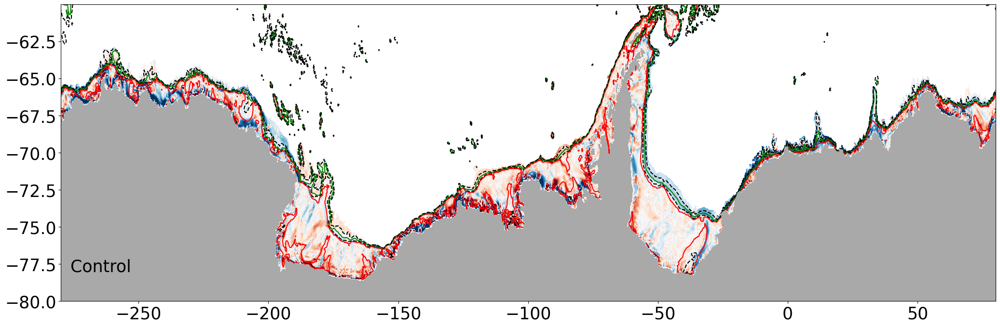

In [41]:
fig, ax = plt.subplots(figsize = (25,8))

# accessom2-01
cmap = ualong_decademean_ctrl.u_along.isel(decade = 4).plot.contourf(levels  = np.arange(-0.1,0.1,0.01), add_colorbar = False, ax = ax)
#cs = hu_region.where(hu_region < 2600).plot.contour(levels  = [2500], color = 'k', ax = ax[0])
#changeline_cs('solid')
cs = hu_region.plot.contour(levels  = [1000], color = 'k', ax = ax, linestyle = 'dashed') #conventional definition for ASC
changeline_cs('dashed')
cs = hu_region.plot.contour(levels  = [600], color = 'r', ax = ax) #conventional definition for ASC
changeline_cs_r('solid')

cs = hu_region.plot.contour(levels  = [1500], color = 'g', ax = ax) #conventional definition for ASC
changeline_cs_g('solid')
cs = hu_region.plot.contour(levels  = [2000], color = 'k', ax = ax, linestyle = 'dashed') #conventional definition for ASC
changeline_cs('dashed')

ax.set_ylabel('')
ax.contourf(hu.xu_ocean, land_mask_lat, land_mask_masked, colors='darkgrey', zorder=2)
ax.text(0.01,0.1,'Control',transform=ax.transAxes)
ax.set_xlabel('')


In [33]:
mask_ASC_N = xr.where((hu<2000) & ( hu > 1500), True, False)
mask_ASC_S = xr.where((hu<1500) & ( hu > 1000), True, False)
mask_ACoC_N = xr.where((hu<1000) & ( hu > 700), True, False)
mask_ACoC_S = xr.where(hu<700, True, False)

In [34]:
import cmocean
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

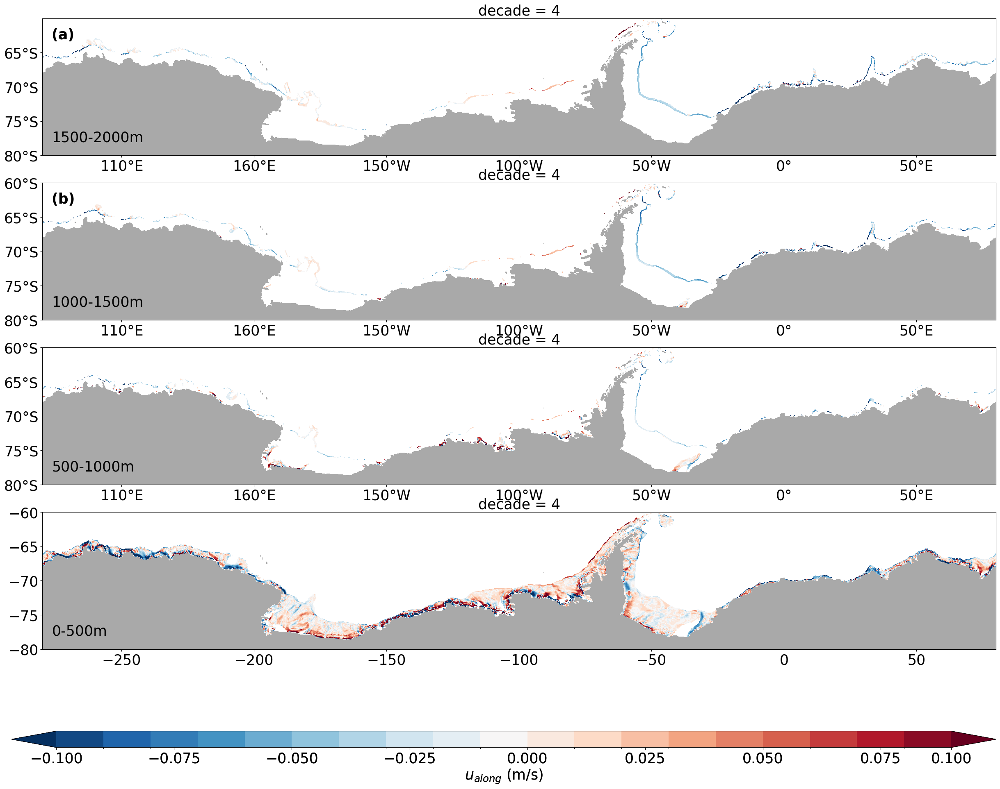

In [58]:
fig, ax = plt.subplots(nrows =4 ,figsize = (30,20))

# accessom2-01
cmap = ualong_decademean_ctrl.u_along.isel(decade = 4).where(mask_ASC_N == True).plot.contourf(levels  = np.arange(-0.1,0.1,0.01), add_colorbar = False, ax = ax[0])

ax[0].set_ylabel('')
ax[0].contourf(hu.xu_ocean, land_mask_lat, land_mask_masked, colors='darkgrey', zorder=2)
ax[1].text(0.01,0.1,'1500-2000m',transform=ax[0].transAxes)
ax[0].set_xlabel('')
ax[0].text(0.01,0.85,'(a)', transform=ax[0].transAxes, fontweight = 'bold')



cmap = ualong_decademean_ctrl.u_along.isel(decade = 4).where(mask_ASC_S == True).plot.contourf(levels  = np.arange(-0.1,0.1,0.01), add_colorbar = False, ax = ax[1])

ax[1].contourf(hu.xu_ocean, land_mask_lat, land_mask_masked, colors='darkgrey', zorder=2)
ax[1].set_ylim([-80,-60])
ax[1].text(0.01,0.1,'1000-1500m',transform=ax[1].transAxes)
ax[1].set_ylabel('')
ax[1].set_xlabel('')
ax[1].text(0.01,0.85,'(b)', transform=ax[1].transAxes, fontweight = 'bold')

cb_ax = fig.add_axes([0.1, -0.01, 0.8, 0.02])
cbar = plt.colorbar(cmap, label = '$u_{along}$ (m/s)', orientation = 'horizontal', cax = cb_ax, pad = 0.1)
cbar.set_ticks(np.arange(-0.1,0.125,0.025))


cmap = ualong_decademean_ctrl.u_along.isel(decade = 4).where(mask_ACoC_N == True).plot.contourf(levels  = np.arange(-0.1,0.1,0.01), add_colorbar = False, ax = ax[2])


ax[2].contourf(hu.xu_ocean, land_mask_lat, land_mask_masked, colors='darkgrey', zorder=2)
ax[2].set_ylim([-80,-60])
ax[2].text(0.01,0.1,'500-1000m',transform=ax[2].transAxes)
ax[2].set_ylabel('')
ax[2].set_xlabel('')

cmap = ualong_decademean_ctrl.u_along.isel(decade = 4).where(mask_ACoC_S == True).plot.contourf(levels  = np.arange(-0.1,0.1,0.01), add_colorbar = False, ax = ax[3])
#np.flip(deptho, 0).plot.contour(levels  = np.arange(0,4000,500), cmap = 'gray_r' , ax = ax[1]) # shallow is dark ' Greys deep is dark

ax[3].contourf(hu.xu_ocean, land_mask_lat, land_mask_masked, colors='darkgrey', zorder=2)
ax[3].set_ylim([-80,-60])
ax[3].text(0.01,0.1,'0-500m',transform=ax[3].transAxes)
ax[3].set_ylabel('')
ax[3].set_xlabel('')

cb_ax = fig.add_axes([0.1, -0.01, 0.8, 0.02])
cbar = plt.colorbar(cmap, label = '$u_{along}$ (m/s)', orientation = 'horizontal', cax = cb_ax, pad = 0.01)
cbar.set_ticks(np.arange(-0.1,0.125,0.025))

for box in range(3):
    ax[box].yaxis.set_major_formatter(LatitudeFormatter())
    ax[box].xaxis.set_major_formatter(LongitudeFormatter())


## calculate depth av of salt and temp here

In [118]:
def var_ave_mask_isobath(mask, var):
    '''
    var: one time step of 3d variable field
    mask: mask to include relevant isobath range on t grid
    OUTPUT
    var_mask_av: area-average over isobath range
    '''
    var_mask = (var.where(mask == True)*thickness).sum('st_ocean') / thickness.sum('st_ocean')
    print(var_mask)
    ## LINE BELOW DOES NOT DO AREA_T*CLUSTER_MASK_ACCESS
    var_mask_av = grid.integrate(var_mask, axis = ['X','Y']).load()/area_t.where(mask == True).sum().values  
    #.load()
    return var_mask_av

In [119]:
%%time
var = cc.querying.getvar(expt=expt, variable= 'temp', 
                          session=session, frequency='1 monthly', chunks = {'time': 100, 'st_ocean':40, 'yt_ocean':250, 'xt_ocean':1200})\
        .sel(yt_ocean = slice(-79,-60)).isel(time = slice(0,100))#.load()#.chunk({'time': 100, 'yt_ocean':250, 'xt_ocean':1200}).load()
var

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "st_ocean" starting at index 40. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 250. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "st_ocean" starting at index 40. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-2

CPU times: user 2.86 s, sys: 340 ms, total: 3.2 s
Wall time: 6.94 s


<xarray.DataArray 'temp' (time: 100, st_ocean: 75, yt_ocean: 440, xt_ocean: 3600)> Size: 48GB
dask.array<getitem, shape=(100, 75, 440, 3600), dtype=float32, chunksize=(3, 40, 240, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) object 800B 2110-01-16 12:00:00 ... 2118-04-16 00:00:00
Attributes:
    long_name:      Conservative temperature
    units:          K
    valid_range:    [-10. 500.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  sea_water_conservative_temperature
    ncfiles:        ['/g/data/cj50/access-om2/raw-output/access-om2-01/01deg_...

In [122]:
def var_field_isobath(var_name):
    
    ## save temp differences depth-av
    var = cc.querying.getvar(expt=expt, variable= var_name, 
                              session=session, frequency='1 monthly', \
                             chunks = {'time': 100,  'yt_ocean':500, 'xt_ocean':1200})\
            .sel(yt_ocean = slice(-79,-60))#.load()
    
    var = var * cluster_mask_access
    print('load')
    
    var_0_500 = []
    var_boundary_ASC_ACoC = []
    var_1000_1500 = []
    var_1500_2000 = []

    diff_var_ASC_matrix = []
    for tt in range(1):
        var_t = var.isel(time = slice(tt*600,(tt+1)*600))
        '''
        var_0_500_ave = var_ave_mask_isobath(mask_0_500, var_t)
        print('0,500')
        '''
        var_boundary_ASC_ACoC_ave = var_ave_mask_isobath(boundary_range_mask, var_t)
        print('0,500')
        '''
        var_1000_1500_ave = var_ave_mask_isobath(mask_1000_1500, var_t)
        print('0,500')
        
        var_1500_2000_ave = var_ave_mask_isobath(mask_1500_2000, var_t)
        print('0,500')
        
        var_0_500.append(var_0_500_ave)
        '''
        var_boundary_ASC_ACoC.append(var_boundary_ASC_ACoC_ave)
        '''
        var_1000_1500.append(var_1000_1500_ave)

        var_1500_2000.append(var_1500_2000_ave)
        
        del  var_1500_2000_ave ,var_0_500_ave, var_boundary_ASC_ACoC_ave, var_1000_1500_ave,
        '''
    return   var_boundary_ASC_ACoC#, var_0_500, var_1000_1500,var_1500_2000 # 

In [123]:
%%time
salt_boundary_ASC_ACoC = var_field_isobath('salt')
temp_boundary_ASC_ACoC = var_field_isobath('temp')

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3

load
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
 

0,500


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3

load
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
 

0,500
CPU times: user 9min 13s, sys: 53.7 s, total: 10min 7s
Wall time: 20min 15s


In [124]:
salt_boundary_ASC_ACoC

[<xarray.DataArray (time: 600)> Size: 5kB
 array([34.55229212, 34.54793375, 34.5453811 , 34.54273073, 34.53837028,
        34.54128422, 34.54187923, 34.5468865 , 34.55402472, 34.55948157,
        34.56187362, 34.55802825, 34.55141396, 34.5471115 , 34.54481079,
        34.54192564, 34.53754285, 34.53994703, 34.54024951, 34.54541077,
        34.55290708, 34.55878479, 34.56112968, 34.55779328, 34.55130913,
        34.54686453, 34.54520665, 34.54171147, 34.53781828, 34.54044819,
        34.5403971 , 34.54600963, 34.55348807, 34.55910798, 34.56151738,
        34.55780085, 34.5516757 , 34.54656186, 34.54396924, 34.54030462,
        34.53665495, 34.53943499, 34.54019319, 34.54544278, 34.55270209,
        34.5583135 , 34.56065103, 34.55694655, 34.55025092, 34.54552447,
        34.54302551, 34.53969204, 34.53497979, 34.53733429, 34.53817063,
        34.54331672, 34.55049913, 34.55595319, 34.55847449, 34.55501205,
        34.54884935, 34.54444221, 34.54239236, 34.53911221, 34.53455031,
        3

In [126]:
salt_boundary_ASC_ACoC[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/salt_boundary_ASC_ACoC.nc')
temp_boundary_ASC_ACoC[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/temp_boundary_ASC_ACoC.nc')

In [45]:
%%time
 #temp_1500_2000 = var_field_isobath('temp') #temp_0_500, temp_500_1000, temp_1000_1500,
salt_0_500, salt_500_1000, salt_1000_1500, salt_1500_2000 = var_field_isobath('salt')

Task exception was never retrieved
future: <Task finished name='Task-2785320' coro=<Client._gather.<locals>.wait() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py:2197> exception=AllExit()>
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py", line 2206, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-2785308' coro=<Client._gather.<locals>.wait() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py:2197> exception=AllExit()>
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py", line 2206, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retriev

load
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
 

0,500
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


0,500
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
0,500
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  

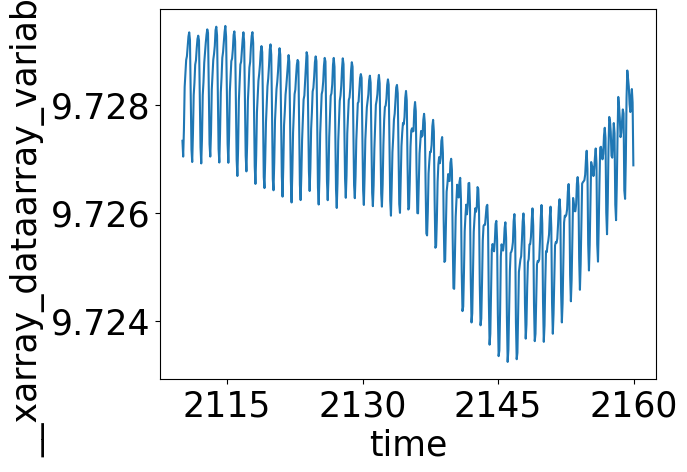

In [222]:
salt_1500_2000.__xarray_dataarray_variable__.plot()

In [202]:
salt_1500_2000[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/salt_N_ASC_edge_2400_2500_masked.nc')

In [203]:
temp_1500_2000[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/temp_N_ASC_edge_2400_2500_masked.nc')

In [46]:
%%time
temp_0_500, temp_500_1000, temp_1000_1500, temp_1500_2000 = var_field_isobath('temp')


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 500. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3

load
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
 

0,500
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  * time      (time) object 5kB 2110-01-16 12:00:00 ... 2159-12-16 12:00:00
    geolon_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
    geolat_t  (yt_ocean, xt_ocean) float32 6MB dask.array<chunksize=(250, 1200), meta=np.ndarray>
0,500
<xarray.DataArray (time: 600, yt_ocean: 440, xt_ocean: 3600)> Size: 8GB
dask.array<truediv, shape=(600, 440, 3600), dtype=float64, chunksize=(3, 250, 1200), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 29kB -279.9 -279.8 -279.7 ... 79.75 79.85 79.95
  * yt_ocean  (yt_ocean) float64 4kB -79.0 -78.95 -78.91 ... -60.15 -60.1 -60.05
  

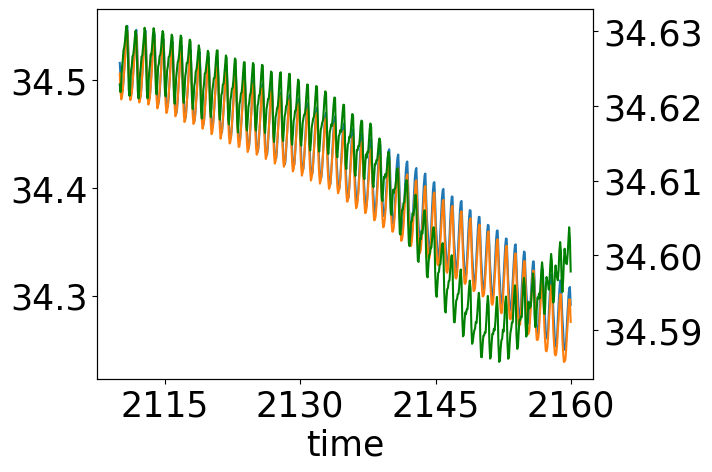

In [94]:
#xr.concat([salt_1500_2000[i].rename('salt') for i in range(6)], dim = 'time').plot()
fig, ax = plt.subplots()
salt_1000_1500[0].plot()
salt_500_1000[0].plot()
ax2 = ax.twinx()
salt_1500_2000[0].plot(ax = ax2, c = 'g')


In [47]:
temp_0_500[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/temp_S_CC_edge_masked.nc')
temp_500_1000[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/temp_N_CC_edge_masked.nc')
temp_1000_1500[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/temp_S_ASC_edge_masked.nc')
#temp_1500_2000[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/temp_N_ASC_edge_masked.nc')

In [48]:
salt_0_500[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/salt_S_CC_edge_masked.nc')
salt_500_1000[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/salt_N_CC_edge_masked.nc')
salt_1000_1500[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/salt_S_ASC_edge_masked.nc')
#salt_1500_2000[0].to_netcdf('/g/data/v45/qo9901/MW-perturb-ASC-data/salt_N_ASC_edge_masked.nc')

In [ ]:
import gc 
c.run(gc.collect)

In [53]:
## calculate thermal wind velocity

## plotting master

In [26]:
diff_temp_ASC_t = xr.open_mfdataset('/g/data/v45/qo9901/MW-perturb-ASC-data/diff_temp_600_ASC_t_scaled.nc')
diff_temp_ACoC_t= xr.open_mfdataset('/g/data/v45/qo9901/MW-perturb-ASC-data/diff_temp_600_ACoC_t_scaled.nc')
diff_salt_ASC_t= xr.open_mfdataset('/g/data/v45/qo9901/MW-perturb-ASC-data/diff_salt_600_ASC_t_scaled.nc')
diff_salt_ACoC_t= xr.open_mfdataset('/g/data/v45/qo9901/MW-perturb-ASC-data/diff_salt_600_ACoC_t_scaled.nc')

In [27]:
# constants
H_ASC = 1500 #[m]
H_ACoC = 700 # [m]
rho = 135 #[kg/m3]'
alpha = 1e-4 #[K^{-1}]#
beta = 7.5e-4 # [kg/g]
g = 9.81 # [m/s]
f = -1.3e-4 #[s^{-1}]


In [28]:
T_ASC = g*H_ASC**2/f *(-alpha  * -diff_temp_ASC_t.temp + beta * -diff_salt_ASC_t.salt)
T_ACoC = g*H_ACoC**2/f *(-alpha  * -diff_temp_ACoC_t.temp + beta * -diff_salt_ACoC_t.salt)
## salt diff calculates a S - N, minus signs to reverse
# in [Sv]

In [29]:
 temp_comp_ASC = g*H_ASC**2/f *(-alpha  * -diff_temp_ASC_t.temp)
salt_comp_ASC = g*H_ASC**2/f *(beta * -diff_salt_ASC_t.salt)
 temp_comp_ACoC = g*H_ACoC**2/f *(-alpha  * -diff_temp_ACoC_t.temp)
salt_comp_ACoC = g*H_ACoC**2/f *(beta * -diff_salt_ACoC_t.salt)

Text(0.5, 1.0, 'Estimated circumpolar depth-av \n transport through thermal wind balance')

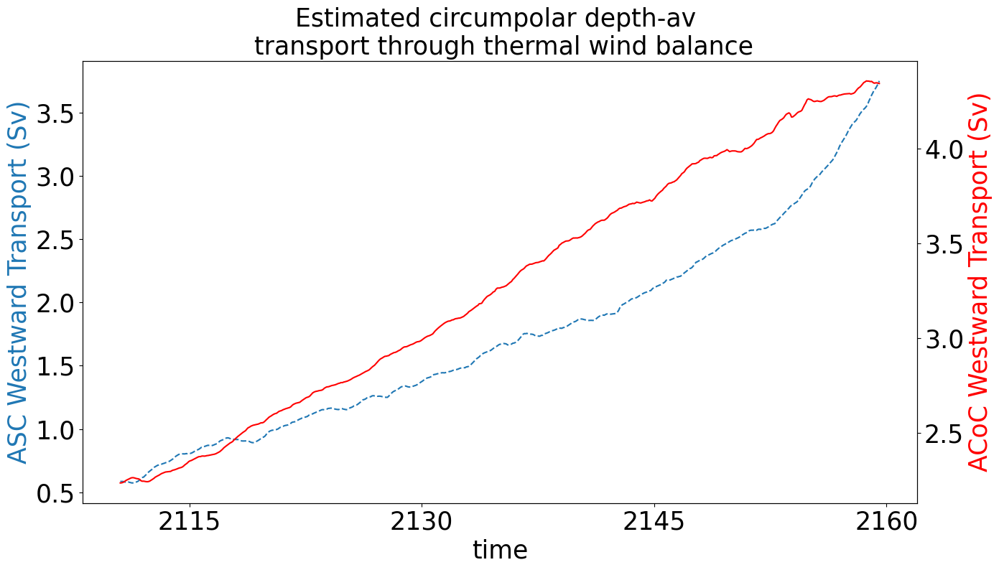

In [61]:
fig, ax = plt.subplots(figsize = (15,8))
(-T_ASC/1e6).rolling(time = 12, center = True).mean().plot( ls = 'dashed',label = 'ASC depth-av')

#ax.set_ylim([15,18])
ax.set_ylabel('ASC Westward Transport (Sv)', color ='C0')

ax2 = ax.twinx()
(-T_ACoC/1e6).rolling(time = 12, center = True).mean().plot(label = 'ACoC depth-av', color = 'r')

#ax2.set_ylim([2.56e6 ,2.56e6 + 0.06e8])
#ax2.set_ylim([0,3])
ax2.set_ylabel('ACoC Westward Transport (Sv)', color ='r')
ax2.set_title('Estimated circumpolar depth-av \n transport through thermal wind balance')

Text(0, 0.5, 'ASC transport (Sv)')

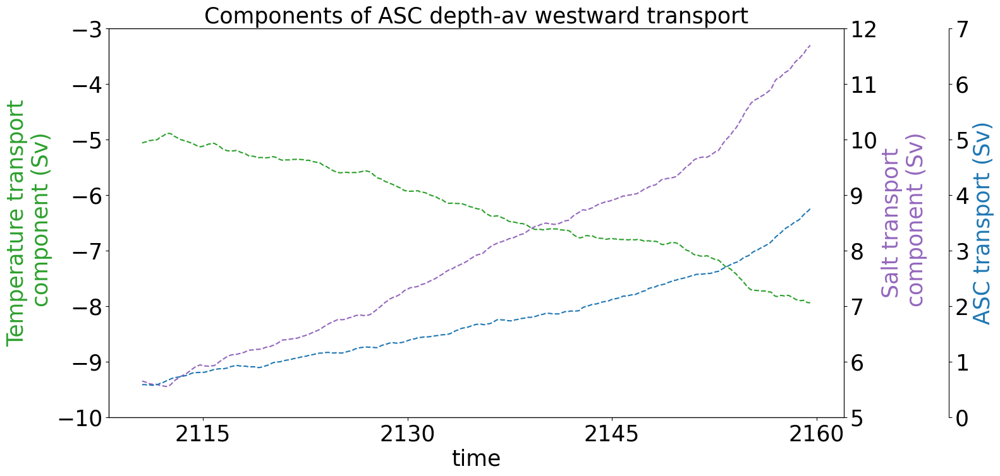

In [73]:
fig, ax = plt.subplots(figsize = (15,8))

(-temp_comp_ASC/1e6).rolling(time = 12, center = True).mean().plot( ls = 'dashed',color = 'C2')
ax.set_ylim([-10,-3])
ax.set_ylabel('Temperature transport\n component (Sv)', color= 'C2')
ax2 = ax.twinx()

(-salt_comp_ASC/1e6).rolling(time = 12, center = True).mean().plot( ls = 'dashed',color = 'C4')
ax2.set_ylim([5,12])
ax2.set_ylabel('Salt transport\n component (Sv)', color= 'C4')

ax.set_title('')
ax2.set_title('Components of ASC depth-av westward transport')

ax3 = ax.twinx()
ax3.spines['right'].set_position(('outward', 120))


(-T_ASC/1e6).rolling(time = 12, center = True).mean().plot( ls = 'dashed',label = 'ASC depth-av', ax = ax3)
ax3.set_ylim([0,7])
ax3.set_ylabel('ASC transport (Sv)', color= 'C0')

#(-salt_comp_ASC/1e6 + -temp_comp_ASC/1e6).rolling(time = 12, center = True).mean().plot(marker = 'x',color = 'k', ax = ax3)

#(-temp_comp_ACoC_surf/1e6).rolling(time = 12, center = True).mean().plot(color = 'C2')
#(-salt_comp_ACoC_surf/1e6).rolling(time = 12, center = True).mean().plot(color = 'C4')

(2.0, 5.0)

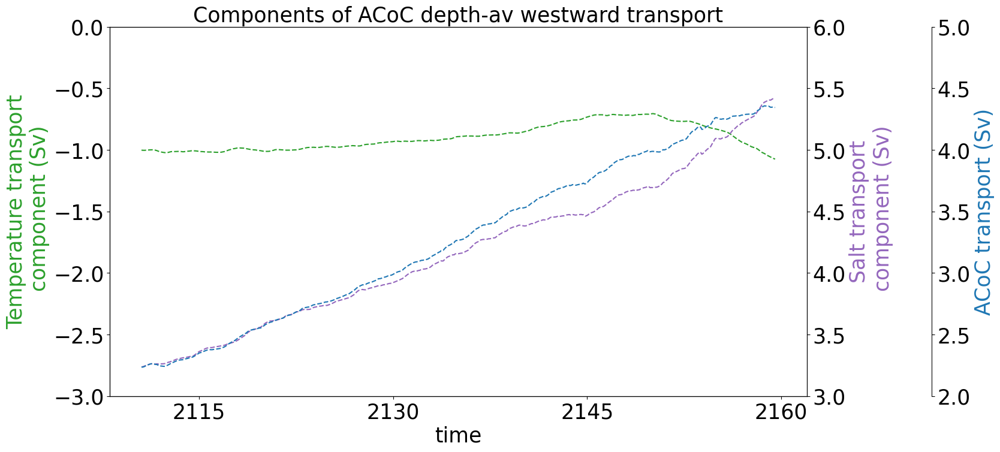

In [74]:
fig, ax = plt.subplots(figsize = (15,8))

(-temp_comp_ACoC/1e6).rolling(time = 12, center = True).mean().plot( ls = 'dashed',color = 'C2')
ax.set_ylim([-3,0])
ax.set_ylabel('Temperature transport\n component (Sv)', color= 'C2')
ax2 = ax.twinx()

(-salt_comp_ACoC/1e6).rolling(time = 12, center = True).mean().plot( ls = 'dashed',color = 'C4')
ax2.set_ylim([3,6])
ax2.set_ylabel('Salt transport\n component (Sv)', color= 'C4')

ax.set_title('')
ax2.set_title('Components of ACoC depth-av westward transport')


ax3 = ax.twinx()
ax3.spines['right'].set_position(('outward', 150))

(-T_ACoC/1e6).rolling(time = 12, center = True).mean().plot( ls = 'dashed',label = 'ACoC depth-av', ax = ax3)
#(-salt_comp_ACoC/1e6 + -temp_comp_ACoC/1e6).rolling(time = 12, center = True).mean().plot(marker = 'x',color = 'k', ax = ax3)
ax3.set_ylabel('ACoC transport (Sv)', color= 'C0')

ax3.set_ylim([2,5])
#(-temp_comp_ACoC_surf/1e6).rolling(time = 12, center = True).mean().plot(color = 'C2')
#(-salt_comp_ACoC_surf/1e6).rolling(time = 12, center = True).mean().plot(color = 'C4')

## temp differences isobath

In [163]:
FileList = ['temp_S_CC_edge_masked.nc','temp_ASC_ACoC_boundary_wcanyons.nc',  'temp_ASC_ACoC_boundary_wcanyons.nc','temp_N_ASC_edge_2400_2500_masked.nc'] #_1800
temp_dir = ['/g/data/v45/qo9901/MW-perturb-ASC-data/' + (FileList[i]) for i in range(len(FileList))]
[temp_0_500,temp_500_1000,  temp_1000_1500,  temp_1500_2000] = \
    [xr.open_mfdataset(temp_dir[i]) for i in range(len(FileList))]
temp_0_500

<xarray.Dataset> Size: 10kB
Dimensions:                        (time: 600)
Coordinates:
  * time                           (time) object 5kB 2110-01-16 12:00:00 ... ...
Data variables:
    __xarray_dataarray_variable__  (time) float64 5kB dask.array<chunksize=(600,), meta=np.ndarray>

In [128]:
FileList = ['salt_S_CC_edge_masked.nc','salt_ASC_ACoC_boundary_wcanyons.nc',  'salt_ASC_ACoC_boundary_wcanyons.nc','salt_N_ASC_edge_2400_2500_masked.nc'] #_1800
salt_dir = ['/g/data/v45/qo9901/MW-perturb-ASC-data/' + (FileList[i]) for i in range(len(FileList))]
[salt_0_500,salt_500_1000,  salt_1000_1500,  salt_1500_2000 ] = \
    [xr.open_mfdataset(salt_dir[i]) for i in range(len(FileList))]
salt_0_500

<xarray.Dataset> Size: 10kB
Dimensions:                        (time: 600)
Coordinates:
  * time                           (time) object 5kB 2110-01-16 12:00:00 ... ...
Data variables:
    __xarray_dataarray_variable__  (time) float64 5kB dask.array<chunksize=(600,), meta=np.ndarray>

In [131]:
salt_mid = salt_boundary_ASC_ACoC[0]
temp_mid = temp_boundary_ASC_ACoC[0]

In [133]:
temp_mid_scaled = temp_mid*area_t.where(boundary_range_mask == True).sum().values/(area_t*cluster_mask_access).where(boundary_range_mask == True).sum().values
salt_mid_scaled = salt_mid*area_t.where(boundary_range_mask == True).sum().values/(area_t*cluster_mask_access).where(boundary_range_mask == True).sum().values


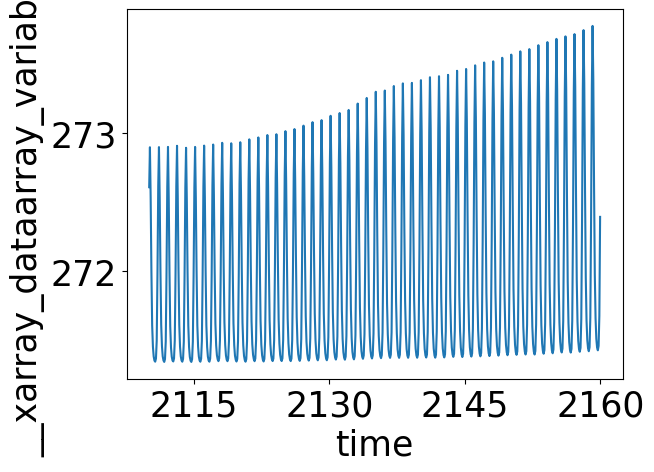

In [168]:
temp_0_500_scaled.__xarray_dataarray_variable__.plot()

In [129]:
mask_500_1000 = xr.where((ht < 600) & (ht >500 ), True, False) 
mask_0_500 = xr.where( ht < 200 , True, False) 
mask_1500_2000 = xr.where((ht < 2500) & (ht > 2400), True, False)  
mask_1000_1500 = xr.where((ht < 700) & (ht > 600), True, False) 


In [52]:
(area_t*cluster_mask_access).where(mask_1500_2000 == True).sum().values

array(5.076218e+10, dtype=float32)

In [166]:
## mask with clusters
cluster_mask_access = xr.open_mfdataset('/home/561/qo9901/Antarctic-Eddy-Res-Compare/largest_3cluster_mask_xr_accessom201.nc')
cluster_mask_access = cluster_mask_access.assign_coords(xu_ocean = ('xu_ocean', hu.xu_ocean.data), yu_ocean = ('yu_ocean', hu.yu_ocean.data))

### interpolate to t grid
cluster_mask_access = grid.interp(cluster_mask_access.__xarray_dataarray_variable__, axis = ['X','Y'])


In [167]:

temp_0_500_scaled = temp_0_500*area_t.where(mask_0_500 == True).sum().values/(area_t*cluster_mask_access).where(mask_0_500 == True).sum().values
#temp_500_1000_scaled = temp_500_1000*area_t.where(mask_500_1000 == True).sum().values/(area_t*cluster_mask_access).where(mask_500_1000 == True).sum().values
#temp_1000_1500_scaled = temp_1000_1500*area_t.where(mask_1000_1500 == True).sum().values/(area_t*cluster_mask_access).where(mask_1000_1500 == True).sum().values
temp_1500_2000_scaled = temp_1500_2000*area_t.where(mask_1500_2000 == True).sum().values/(area_t*cluster_mask_access).where(mask_1500_2000 == True).sum().values

salt_0_500_scaled = salt_0_500*area_t.where(mask_0_500 == True).sum().values/(area_t*cluster_mask_access).where(mask_0_500 == True).sum().values
#salt_500_1000_scaled = salt_500_1000*area_t.where(mask_500_1000 == True).sum().values/(area_t*cluster_mask_access).where(mask_500_1000 == True).sum().values
#salt_1000_1500_scaled = salt_1000_1500*area_t.where(mask_1000_1500 == True).sum().values/(area_t*cluster_mask_access).where(mask_1000_1500 == True).sum().values
salt_1500_2000_scaled = salt_1500_2000*area_t.where(mask_1500_2000 == True).sum().values/(area_t*cluster_mask_access).where(mask_1500_2000 == True).sum().values
'''
temp_0_500_scaled = temp_0_500*area_t.where(mask_0_500 == True).sum().values/(area_t).where(mask_0_500 == True).sum().values
temp_500_1000_scaled = temp_500_1000*area_t.where(mask_500_1000 == True).sum().values/(area_t).where(mask_500_1000 == True).sum().values
temp_1000_1500_scaled = temp_1000_1500*area_t.where(mask_1000_1500 == True).sum().values/(area_t).where(mask_1000_1500 == True).sum().values
temp_1500_2000_scaled = temp_1500_2000*area_t.where(mask_1500_2000 == True).sum().values/(area_t*cluster_mask_access).where(mask_1500_2000 == True).sum().values

salt_0_500_scaled = salt_0_500*area_t.where(mask_0_500 == True).sum().values/(area_t).where(mask_0_500 == True).sum().values
salt_500_1000_scaled = salt_500_1000*area_t.where(mask_500_1000 == True).sum().values/(area_t).where(mask_500_1000 == True).sum().values
salt_1000_1500_scaled = salt_1000_1500*area_t.where(mask_1000_1500 == True).sum().values/(area_t).where(mask_1000_1500 == True).sum().values
salt_1500_2000_scaled = salt_1500_2000*area_t.where(mask_1500_2000 == True).sum().values/(area_t*cluster_mask_access).where(mask_1500_2000 == True).sum().values
'''

'\ntemp_0_500_scaled = temp_0_500*area_t.where(mask_0_500 == True).sum().values/(area_t).where(mask_0_500 == True).sum().values\ntemp_500_1000_scaled = temp_500_1000*area_t.where(mask_500_1000 == True).sum().values/(area_t).where(mask_500_1000 == True).sum().values\ntemp_1000_1500_scaled = temp_1000_1500*area_t.where(mask_1000_1500 == True).sum().values/(area_t).where(mask_1000_1500 == True).sum().values\ntemp_1500_2000_scaled = temp_1500_2000*area_t.where(mask_1500_2000 == True).sum().values/(area_t*cluster_mask_access).where(mask_1500_2000 == True).sum().values\n\nsalt_0_500_scaled = salt_0_500*area_t.where(mask_0_500 == True).sum().values/(area_t).where(mask_0_500 == True).sum().values\nsalt_500_1000_scaled = salt_500_1000*area_t.where(mask_500_1000 == True).sum().values/(area_t).where(mask_500_1000 == True).sum().values\nsalt_1000_1500_scaled = salt_1000_1500*area_t.where(mask_1000_1500 == True).sum().values/(area_t).where(mask_1000_1500 == True).sum().values\nsalt_1500_2000_scaled

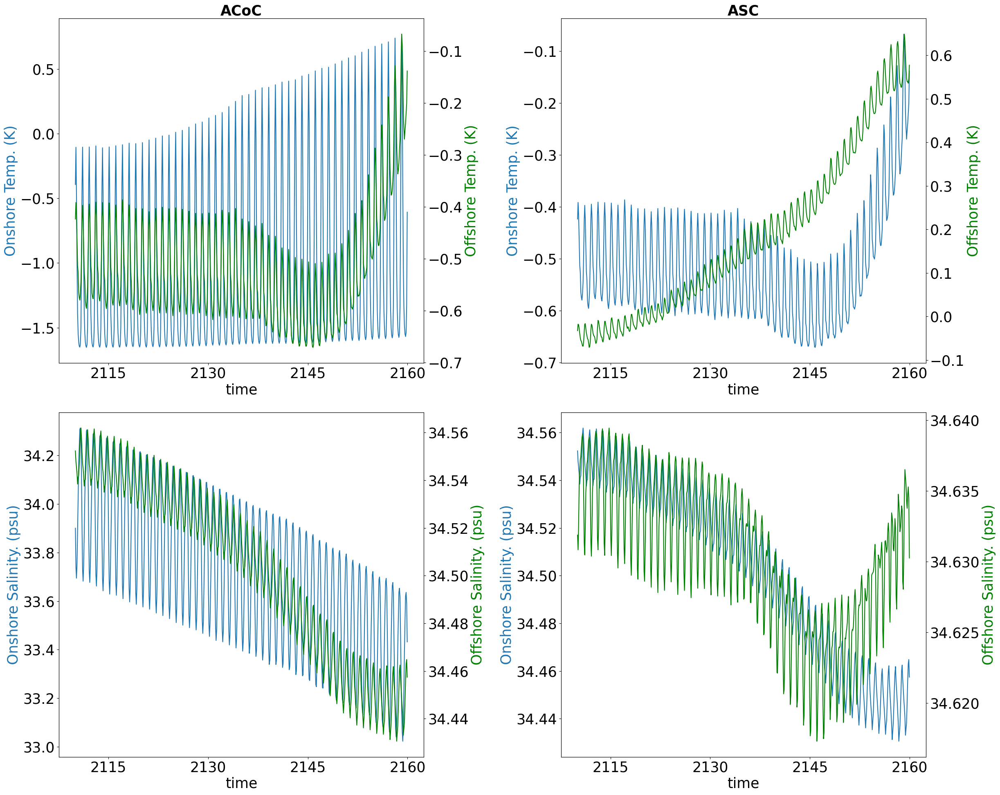

In [169]:
fig,ax = plt.subplots(nrows = 2, ncols = 2, figsize = (25,20))
(temp_0_500_scaled.__xarray_dataarray_variable__ - 273).plot(ax = ax[0,0])
ax2 = ax[0,0].twinx()
(temp_mid_scaled- 273).plot(c = 'g',ax = ax2)
ax[0,0].set_title('ACoC', weight = 'bold')

#ax[0,0].set_ylim([-1.3,-0.3])
ax[0,0].set_ylabel('Onshore Temp. (K)',c = 'C0')
#ax2.set_ylim([-1.3,-0.3])
ax2.set_ylabel('Offshore Temp. (K)',c = 'g')

(temp_mid_scaled- 273).plot(ax = ax[0,1])
ax2 = ax[0,1].twinx()
(temp_1500_2000_scaled.__xarray_dataarray_variable__- 273).plot(c = 'g',ax = ax2)
ax[0,1].set_title('ASC', weight = 'bold')

#ax[0,1].set_ylim([-0.7,0.5])
ax[0,1].set_ylabel('Onshore Temp. (K)',c = 'C0')
#ax2.set_ylim([-0.7,0.5])
ax2.set_ylabel('Offshore Temp. (K)',c = 'g')
                  
salt_0_500_scaled.__xarray_dataarray_variable__.plot(ax = ax[1,0])
ax2 = ax[1,0].twinx()
salt_mid_scaled.plot(c = 'g',ax = ax2)
#ax[1,0].set_ylim([34,34.6])
ax[1,0].set_ylabel('Onshore Salinity. (psu)',c = 'C0')
#ax2.set_ylim([34.,34.6])
ax2.set_ylabel('Offshore Salinity. (psu)',c = 'g')

salt_mid_scaled.plot(ax = ax[1,1])
ax2 = ax[1,1].twinx()
salt_1500_2000_scaled.__xarray_dataarray_variable__.plot(c = 'g',ax = ax2)

#ax[1,1].set_ylim([34.44,34.61])
ax[1,1].set_ylabel('Onshore Salinity. (psu)',c = 'C0')
#ax2.set_ylim([34.44,34.61])
ax2.set_ylabel('Offshore Salinity. (psu)',c = 'g')

plt.tight_layout()

In [170]:
diff_temp_ASC_t = temp_mid_scaled - temp_1500_2000_scaled
diff_temp_ACoC_t= temp_0_500_scaled - temp_mid_scaled
diff_salt_ASC_t= salt_mid_scaled - salt_1500_2000_scaled
diff_salt_ACoC_t= salt_0_500_scaled - salt_mid_scaled

In [171]:
# constants
H_ASC = 1000 #[m]
H_ACoC = 200 # [m]
rho = 1035 #[kg/m3]'
alpha = 1e-4 #[K^{-1}]#
beta = 7.5e-4 # [kg/g]
g = 9.81 # [m/s]
f = -1.3e-4 #[s^{-1}]


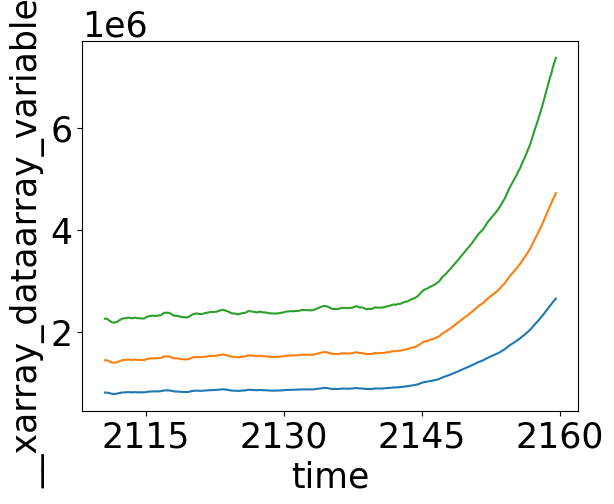

In [172]:
T_ASC_750 = g*750**2/f *(-alpha  * -diff_temp_ASC_t.__xarray_dataarray_variable__ + beta * -diff_salt_ASC_t.__xarray_dataarray_variable__)
T_ASC_1000 = g*1000**2/f *(-alpha  * -diff_temp_ASC_t.__xarray_dataarray_variable__ + beta * -diff_salt_ASC_t.__xarray_dataarray_variable__)
T_ASC_1500 = g*1250**2/f *(-alpha  * -diff_temp_ASC_t.__xarray_dataarray_variable__ + beta * -diff_salt_ASC_t.__xarray_dataarray_variable__)
(-T_ASC_750).rolling(time = 12, center = True).mean().plot()
(-T_ASC_1000).rolling(time = 12, center = True).mean().plot()
(-T_ASC_1500).rolling(time = 12, center = True).mean().plot()

In [173]:
T_ASC = g*H_ASC**2/f *(-alpha  * -diff_temp_ASC_t.__xarray_dataarray_variable__ + beta * -diff_salt_ASC_t.__xarray_dataarray_variable__)
T_ACoC = g*H_ACoC**2/f *(-alpha  * -diff_temp_ACoC_t.__xarray_dataarray_variable__ + beta * -diff_salt_ACoC_t.__xarray_dataarray_variable__)
## salt diff calculates a S - N, minus signs to reverse
# in [Sv]

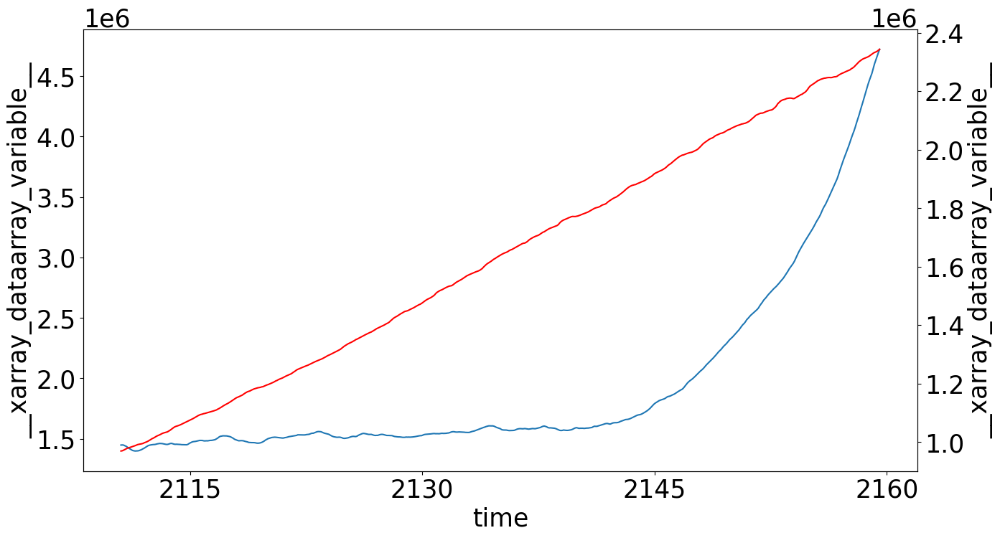

In [174]:
fig, ax = plt.subplots(figsize = (15,8))
(-T_ASC).rolling(time = 12, center = True).mean().plot()
#ax.set_ylim([5.92e8,5.98e8])
ax2 = ax.twinx()
(-T_ACoC).rolling(time = 12, center = True).mean().plot(color = 'r')
#ax2.set_ylim([2.56e6 ,2.56e6 + 0.06e8])


In [175]:
 temp_comp_ASC = g*H_ASC**2/f *(-alpha  * -diff_temp_ASC_t.__xarray_dataarray_variable__)
salt_comp_ASC = g*H_ASC**2/f *(beta * -diff_salt_ASC_t.__xarray_dataarray_variable__)
 temp_comp_ACoC = g*H_ACoC**2/f *(-alpha  * -diff_temp_ACoC_t.__xarray_dataarray_variable__)
salt_comp_ACoC = g*H_ACoC**2/f *(beta * -diff_salt_ACoC_t.__xarray_dataarray_variable__)

In [176]:
import cftime

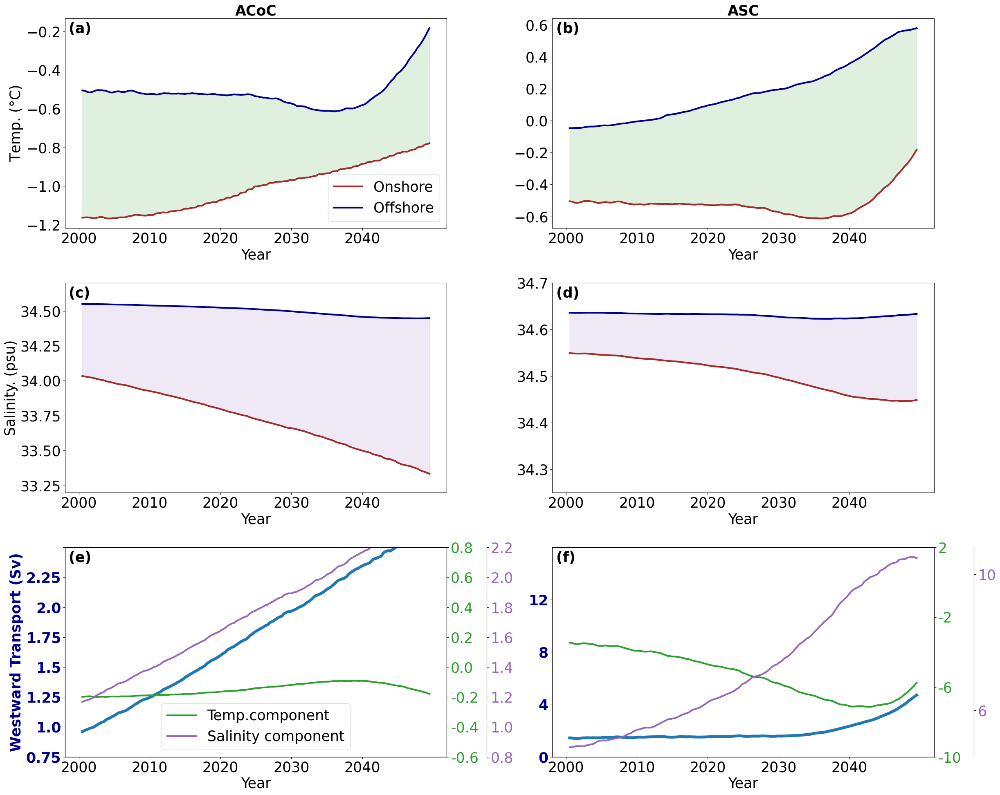

In [179]:
## master plot
lw = 3
#np.set_printoptions(precision=3)
from matplotlib.ticker import FormatStrFormatter

fig,ax = fig, ax = plt.subplot_mosaic("ab;cd;ef", figsize = (25,20))



onshore_offshore_clr = ['brown', 'darkblue']
(temp_0_500_scaled.__xarray_dataarray_variable__ - 273).rolling(time = 12, center = True).mean().plot(label = 'Onshore',\
                                    color = onshore_offshore_clr[0], ax = ax['a'], lw = lw)
(temp_mid_scaled- 273).rolling(time = 12, center = True).mean().plot( label = 'Offshore', \
                                      color = onshore_offshore_clr[1], ax = ax['a'], lw = lw)
ax['a'].fill_between(salt_0_500_scaled.time.values, \
                     (temp_0_500_scaled.__xarray_dataarray_variable__- 273).rolling(time = 12, center = True).mean().values,\
                     (temp_mid_scaled- 273).rolling(time = 12, center = True).mean().values, \
                     alpha = 0.15, color = 'C2')
ax['a'].set_title('ACoC', weight = 'bold')
#ax['a'].set_ylim([-1.3,-0.3])
ax['a'].set_ylabel(r'Temp. ($\degree$C)')
ax['a'].legend(loc = 'lower right')

(temp_mid_scaled- 273).rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[0], ax = ax['b'], lw = lw)
(temp_1500_2000_scaled.__xarray_dataarray_variable__- 273).rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[1],ax = ax['b'], lw = lw)

ax['b'].fill_between(temp_mid_scaled.time.values, \
                     (temp_mid_scaled- 273).rolling(time = 12, center = True).mean().values,\
                     (temp_1500_2000_scaled.__xarray_dataarray_variable__- 273).rolling(time = 12, center = True).mean().values,\
                     alpha = 0.15, color = 'C2')

ax['b'].set_title('ASC', weight = 'bold')

#ax['b'].set_ylim([-0.7,0.5])
ax['b'].set_ylabel('')
  
salt_0_500_scaled.__xarray_dataarray_variable__.rolling(time = 12, center = True).mean().plot( color = onshore_offshore_clr[0],ax = ax['c'], lw = lw)
salt_mid_scaled.rolling(time = 12, center = True).mean().plot( color = onshore_offshore_clr[1],ax = ax['c'], lw = lw)
ax['c'].fill_between(salt_0_500_scaled.time.values, salt_0_500_scaled.__xarray_dataarray_variable__.rolling(time = 12, center = True).mean().values,\
                     salt_mid_scaled.rolling(time = 12, center = True).mean().values, alpha = 0.15, color = 'C4')
ax['c'].set_ylim([33.2,34.7])
ax['c'].set_ylabel('Salinity. (psu)')

salt_mid_scaled.rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[0],ax = ax['d'], lw = lw)
salt_1500_2000_scaled.__xarray_dataarray_variable__.rolling(time = 12, center = True).mean()\
    .plot( color = onshore_offshore_clr[1], ax = ax['d'], lw = lw)
ax['d'].fill_between(salt_1500_2000_scaled.time.values, \
                     salt_1500_2000_scaled.__xarray_dataarray_variable__.rolling(time = 12, center = True).mean().values,\
                     salt_mid_scaled.rolling(time = 12, center = True).mean().values, alpha = 0.15, color = 'C4')
ax['d'].set_ylim([34.25,34.7])
ax['d'].set_ylabel('')


(-T_ACoC/1e6).rolling(time = 12, center = True).mean()\
    .plot(ax = ax['e'], label = 'ACoC depth-av', color = 'C0', lw = 5)
ax2 = ax['e'].twinx()
ax['e'].set_ylim([0.8,2.2])

ax2.spines['right']
(-temp_comp_ACoC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C2', ax = ax2, lw = lw, label = 'Temp.component')
ax2.set_ylim([-0.6,0.8])
ax2.set_yticklabels(labels = ax2.get_yticks(), color = 'C2')
ax2.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax2.set_ylabel('')

ax3 = ax['e'].twinx()
ax3.spines['right'].set_position(('outward', 70))
ax3.set_ylim([0.8,2.2])
(-salt_comp_ACoC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C4', ax = ax3, lw = lw, label = 'Salinity component')
ax3.set_yticklabels(labels = ax3.get_yticks(), color = 'C4')
ax3.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax3.set_ylabel('', color= 'C4')

ax['e'].set_yticklabels(labels = ax['e'].get_yticks(), color = onshore_offshore_clr[1], fontweight = 'bold')
ax['e'].set_ylabel('Westward Transport (Sv)', color = onshore_offshore_clr[1], fontweight = 'bold')

### Do everything for plot4 as before
handles4,labels4 = ax2.get_legend_handles_labels()
### Do everything for plot4a
handles4a,labels4a = ax3.get_legend_handles_labels()
### Combine the legend handles and labels to make a new legend object
handles = handles4 + handles4a
labels = labels4 + labels4a


(-T_ASC/1e6).rolling(time = 12, center = True).mean()\
    .plot( label = 'ASC depth-av', ax = ax['f'], lw = 5, ylim = (0,16))
ax['f'].set_yticks(range(0,16,4))
ax['f'].set_yticklabels(labels =  ax['f'].get_yticks(), color = onshore_offshore_clr[1], fontweight = 'bold')
ax['f'].set_ylabel('')

ax4 = ax['f'].twinx()
(-temp_comp_ASC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C2', ax = ax4, lw = lw)
ax4.set_yticks(range(-10,6,4))
ax4.set_yticklabels(labels = ax4.get_yticks(), color = 'C2')
ax4.set_ylabel('')

ax5 = ax['f'].twinx()
ax5.spines['right'].set_position(('outward', 70))
ax5.set_yticks(range(6,22,4))
(-salt_comp_ASC/1e6).rolling(time = 12, center = True).mean()\
    .plot( color = 'C4', ax = ax5, lw = lw)
ax5.set_yticklabels(labels = ax5.get_yticks(), color = 'C4')
ax5.set_ylabel('')

#ax4.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#ax5.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))


for letter in list(map(chr, range(ord('a'), ord('f')+1))):
        ax[letter].set_xticks(salt_1000_1500_scaled.time[::120].values)
        ax[letter].set_xticklabels(np.arange(2000,2050,10))
        ax[letter].set_xlabel('Year')
        ax[letter].text(0.01,0.93,'(' + letter + ')', \
                        transform=ax[letter].transAxes, fontweight = 'bold')
ax['e'].legend(handles, labels, loc = 'lower center')

plt.tight_layout()